# Introduction 

For this project we will be looking at training a Generative Adversarial Network (GAN) to generate Monet paintings from a randomized latent vector. We have been provided a folder of Monet paintings that are 256x256 pixels and a folder of photo graphs that are 256x256. For this project we will focus on the Monet paintings and how to generate them. 

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
from pathlib import Path 

In [3]:
def ls(path):
    entities = path.glob("*")
    for ent in entities:
        if ent.is_dir():
            print(ent)

In [4]:
ls(Path.cwd() / '..' / 'input' / 'gan-getting-started' )

/kaggle/working/../input/gan-getting-started/monet_jpg
/kaggle/working/../input/gan-getting-started/photo_tfrec
/kaggle/working/../input/gan-getting-started/photo_jpg
/kaggle/working/../input/gan-getting-started/monet_tfrec


In [5]:
import matplotlib.pyplot as plt 
from PIL import Image 

# EDA
Since we don't have labeled data, all we can really do is see some samples from our data, view the size and shape

In [6]:
def plot_images(images, rows=3, cols=3):
    fig, ax = plt.subplots(rows, cols, figsize=(6,6))
    for i, a in enumerate(ax.flat):
        img = Image.open(images[i])
        a.imshow(img) 
        a.axis('off')
    plt.tight_layout()
    plt.show() 
    

In [7]:
def get_images(img_dir):
    images = img_dir.glob("*.jpg")
    return images

In [8]:
monet_images = get_images(Path('/kaggle/working/../input/gan-getting-started/monet_jpg'))
monet_samples = []
for i, img in enumerate(monet_images):
    if i == 10:
        break
    monet_samples.append(img)
plot_images(monet_samples)

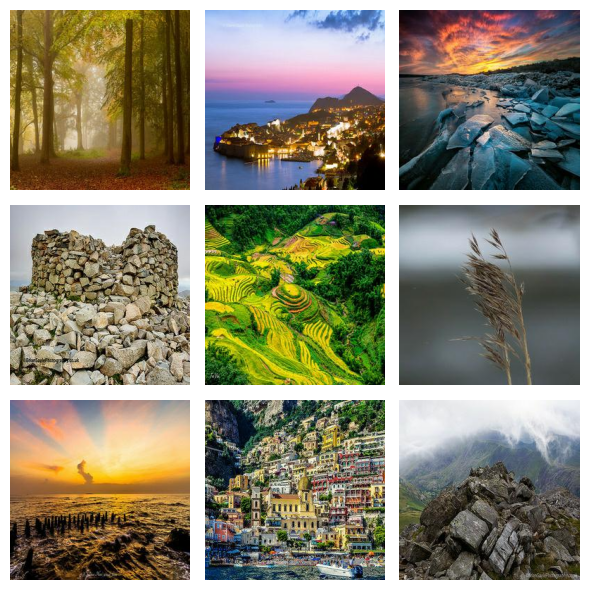

In [9]:
photo_images = get_images(Path('/kaggle/working/../input/gan-getting-started/photo_jpg'))
photo_samples = []
for i, img in enumerate(photo_images):
    if i == 10:
        break
    photo_samples.append(img)
plot_images(photo_samples)

In [10]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

class ImageDataset(Dataset):
    def __init__(self, images, transform):
        super().__init__()
        self.image_paths = images
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, index):
        img_path = self.image_paths[index]
        image = Image.open(img_path)
        image = self.transform(image)
        return image

In [11]:
training_transformer = transforms.Compose([
                                  transforms.RandomHorizontalFlip(), 
                                  transforms.RandomVerticalFlip(),
                                  transforms.RandomRotation(20), 
                                  transforms.ToTensor(),
                                  transforms.Normalize(mean=[0.5, 0.5, 0.5],std=[0.5, 0.5, 0.5])])

# data_transformer = transforms.Compose([transforms.Pad(64, padding_mode='reflect'),
#                                   transforms.ToTensor(),
#                                   transforms.Normalize(mean=[0.5, 0.5, 0.5],std=[0.5, 0.5, 0.5])])

In [12]:
monet_dataset = ImageDataset(list(monet_images), training_transformer)

In [13]:
photo_dataset = ImageDataset(list(photo_images), training_transformer)

In [14]:
monet_dataset[0].shape

torch.Size([3, 256, 256])

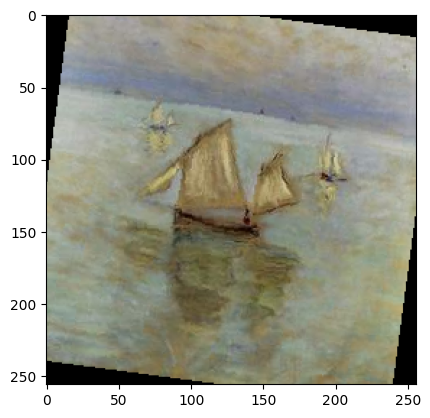

In [15]:
fig, ax = plt.subplots()
ax.imshow((monet_dataset[3].cpu().numpy().transpose(1, 2, 0) + 1) / 2)
fig.show()

# Models
Here we need to define: 
1. Generator 
2. Discriminator

In [16]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [17]:

import torch.nn as nn
import torch.nn.functional as F

In [20]:
class Generator(nn.Module):
    def __init__(self, latent_dim, channels_img):
        super(Generator, self).__init__()
        self.latent_dim = latent_dim
        self.net = nn.Sequential(
            # Input: latent_dim x 1 x 1
            self._block(latent_dim, 1024, 4, 1, 0),  # 4x4
            self._block(1024, 512, 4, 2, 1),  # 8x8
            self._block(512, 256, 4, 2, 1),  # 16x16
            self._block(256, 128, 4, 2, 1),  # 32x32
            self._block(128, 64, 4, 2, 1),  # 64x64
            self._block(64, 32, 4, 2, 1),  # 128x128
            nn.ConvTranspose2d(32, channels_img, kernel_size=4, stride=2, padding=1),  # 256x256
            nn.Tanh()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(True)
        )

    def forward(self, x):
        # Reshape input to (batch_size, latent_dim, 1, 1)
        x = x.view(x.size(0), self.latent_dim, 1, 1)
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, channels_img):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            # Input: channels_img x 256 x 256
            self._block(channels_img, 32, 4, 2, 1),  # 128x128
            self._block(32, 64, 4, 2, 1),  # 64x64
            self._block(64, 128, 4, 2, 1),  # 32x32
            self._block(128, 256, 4, 2, 1),  # 16x16
            self._block(256, 512, 4, 2, 1),  # 8x8
            self._block(512, 1024, 4, 2, 1),  # 4x4
            nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0),  # 1x1
            nn.Sigmoid()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True)
        )

    def forward(self, x):
        return self.net(x).view(-1, 1)

In [22]:
gen = Generator(64, 3)

In [23]:
torch.randn(1, 32)

tensor([[ 0.4261,  0.0654,  0.1267, -0.9268,  1.2999, -0.6510,  0.0894,  0.6230,
          1.7614,  0.4653,  0.6115,  0.8251, -1.5556,  1.7699,  0.1327,  0.2540,
          1.0156, -0.1716,  1.5393,  1.1651,  0.7903,  0.0849, -2.1308, -0.1371,
          1.3132, -0.6127,  0.9600, -0.0088, -0.4457, -2.3732, -0.6136, -0.1941]])

In [24]:
test_gen = gen(torch.randn(1, 64))
test_gen.size()

torch.Size([1, 3, 256, 256])

In [25]:
disc = Discriminator(3)

In [26]:
test_disc = disc(test_gen)
print(test_disc)

tensor([[0.5915]], grad_fn=<ViewBackward0>)


In [27]:
def plot_gen_images(images, rows=2, cols=3):
    images = images[:6]
    fig, ax = plt.subplots(rows, cols, figsize=(6,6))
    for i, a in enumerate(ax.flat):
        img = images[i]
        a.imshow((img.cpu().numpy().transpose(1, 2, 0) + 1) / 2)
        a.axis('off')
    plt.tight_layout()
    plt.show() 
    

def display_gen_output(output):
    fig, ax = plt.subplots()
    ax.imshow((output.cpu().numpy().transpose(1, 2, 0) + 1) / 2)
    fig.show()

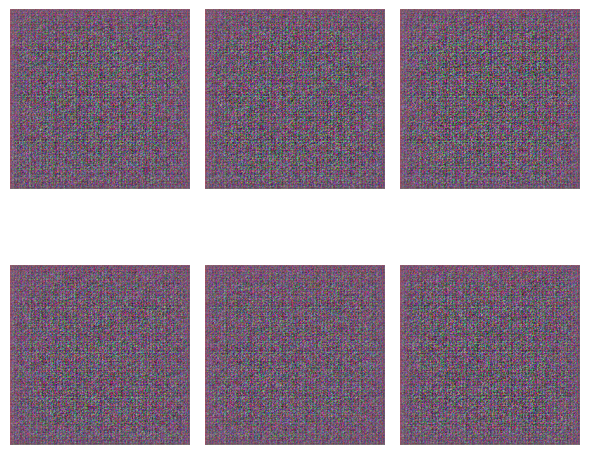

In [28]:
plot_gen_images(gen(torch.randn(6, 64)).detach())

In [29]:
batch_size = 8
dataloader = DataLoader(monet_dataset, batch_size=batch_size, shuffle=True)

# Traing Loop
- latent dim: 128 
- Optimizer: ADAM 
- Loss: BCELoss 
- Epochs: 200x3 (Ran 3 iteration of 200)


In [30]:
import torch.optim as optim

# Hyperparameters
latent_dim = 128


# Initialize generator and discriminator
generator = Generator(latent_dim, 3)
discriminator = Discriminator(3)
generator.to(device)
discriminator.to(device)
# out = generator(torch.randn(6, latent_dim).to(device))
# disc = discriminator(out)
print(disc)

# Loss function and optimizers
criterion = nn.BCELoss()


Discriminator(
  (net): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True,

In [31]:
# checkpoint = torch.load('/kaggle/input/checkpoint1/pytorch/default/1/final_model.pth')
# generator.load_state_dict(checkpoint['generator'])
# discriminator.load_state_dict(checkpoint['discriminator'])

37


11it [00:01, 11.39it/s]

Epoch [1/200], Step [10/37], D_loss: 0.1999, G_loss: 7.7081


21it [00:01, 11.53it/s]

Epoch [1/200], Step [20/37], D_loss: 0.8168, G_loss: 4.7593


31it [00:02, 11.60it/s]

Epoch [1/200], Step [30/37], D_loss: 0.0056, G_loss: 7.7355


37it [00:03, 11.65it/s]
12it [00:01, 11.78it/s]

Epoch [2/200], Step [10/37], D_loss: 0.5856, G_loss: 4.3883


22it [00:01, 11.80it/s]

Epoch [2/200], Step [20/37], D_loss: 0.8028, G_loss: 6.1707


32it [00:02, 11.81it/s]

Epoch [2/200], Step [30/37], D_loss: 0.1583, G_loss: 5.3723


37it [00:03, 11.93it/s]
12it [00:01, 11.88it/s]

Epoch [3/200], Step [10/37], D_loss: 0.2161, G_loss: 5.2162


22it [00:01, 11.64it/s]

Epoch [3/200], Step [20/37], D_loss: 0.5760, G_loss: 2.6612


32it [00:02, 11.68it/s]

Epoch [3/200], Step [30/37], D_loss: 0.3520, G_loss: 4.1296


37it [00:03, 11.84it/s]
12it [00:01, 11.83it/s]

Epoch [4/200], Step [10/37], D_loss: 0.1636, G_loss: 5.1112


22it [00:01, 11.80it/s]

Epoch [4/200], Step [20/37], D_loss: 0.5975, G_loss: 4.2360


32it [00:02, 11.56it/s]

Epoch [4/200], Step [30/37], D_loss: 0.0648, G_loss: 9.3841


37it [00:03, 11.78it/s]
12it [00:01, 11.69it/s]

Epoch [5/200], Step [10/37], D_loss: 0.0280, G_loss: 1.4367


22it [00:01, 11.57it/s]

Epoch [5/200], Step [20/37], D_loss: 0.4768, G_loss: 3.9992


32it [00:02, 11.54it/s]

Epoch [5/200], Step [30/37], D_loss: 0.6869, G_loss: 3.3221


37it [00:03, 11.69it/s]
12it [00:01, 11.60it/s]

Epoch [6/200], Step [10/37], D_loss: 0.3108, G_loss: 2.6457


22it [00:01, 11.50it/s]

Epoch [6/200], Step [20/37], D_loss: 0.0864, G_loss: 2.8635


32it [00:02, 11.42it/s]

Epoch [6/200], Step [30/37], D_loss: 0.0068, G_loss: 3.7371


37it [00:03, 11.61it/s]
12it [00:01, 11.50it/s]

Epoch [7/200], Step [10/37], D_loss: 0.1620, G_loss: 2.6845


22it [00:01, 11.42it/s]

Epoch [7/200], Step [20/37], D_loss: 0.3221, G_loss: 4.0529


32it [00:02, 11.44it/s]

Epoch [7/200], Step [30/37], D_loss: 0.5017, G_loss: 10.1557


37it [00:03, 11.56it/s]
12it [00:01, 11.50it/s]

Epoch [8/200], Step [10/37], D_loss: 0.0180, G_loss: 5.0083


22it [00:01, 11.44it/s]

Epoch [8/200], Step [20/37], D_loss: 0.0575, G_loss: 1.3085


32it [00:02, 11.17it/s]

Epoch [8/200], Step [30/37], D_loss: 0.2555, G_loss: 3.8463


37it [00:03, 11.50it/s]
12it [00:01, 11.44it/s]

Epoch [9/200], Step [10/37], D_loss: 0.0435, G_loss: 4.4011


22it [00:01, 11.34it/s]

Epoch [9/200], Step [20/37], D_loss: 0.0288, G_loss: 8.5849


32it [00:02, 11.35it/s]

Epoch [9/200], Step [30/37], D_loss: 0.5878, G_loss: 2.3969


37it [00:03, 11.50it/s]
12it [00:01, 11.45it/s]

Epoch [10/200], Step [10/37], D_loss: 1.0148, G_loss: 4.2599


22it [00:01, 11.46it/s]

Epoch [10/200], Step [20/37], D_loss: 0.2069, G_loss: 3.1726


32it [00:02, 11.38it/s]

Epoch [10/200], Step [30/37], D_loss: 0.6297, G_loss: 6.7298


37it [00:03, 11.54it/s]


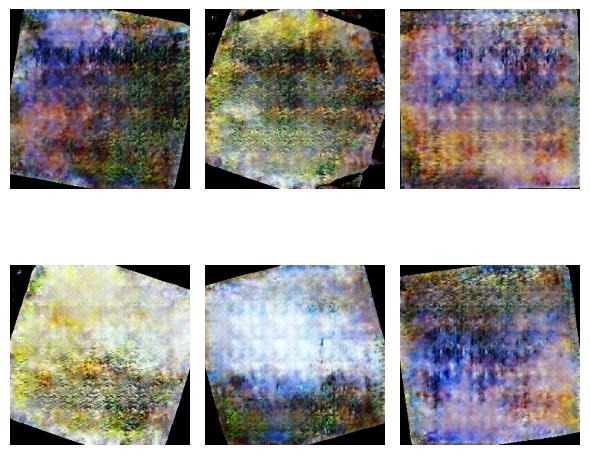

12it [00:01, 11.49it/s]

Epoch [11/200], Step [10/37], D_loss: 0.2762, G_loss: 7.4684


22it [00:01, 11.48it/s]

Epoch [11/200], Step [20/37], D_loss: 0.7952, G_loss: 7.3541


32it [00:02, 11.54it/s]

Epoch [11/200], Step [30/37], D_loss: 0.2053, G_loss: 4.3667


37it [00:03, 11.62it/s]
12it [00:01, 11.58it/s]

Epoch [12/200], Step [10/37], D_loss: 0.2060, G_loss: 5.2980


22it [00:01, 11.59it/s]

Epoch [12/200], Step [20/37], D_loss: 0.4129, G_loss: 2.1145


32it [00:02, 11.52it/s]

Epoch [12/200], Step [30/37], D_loss: 0.3989, G_loss: 4.3530


37it [00:03, 11.68it/s]
12it [00:01, 11.65it/s]

Epoch [13/200], Step [10/37], D_loss: 0.0800, G_loss: 1.5215


22it [00:01, 11.64it/s]

Epoch [13/200], Step [20/37], D_loss: 0.2907, G_loss: 6.7049


32it [00:02, 11.62it/s]

Epoch [13/200], Step [30/37], D_loss: 0.1048, G_loss: 6.2369


37it [00:03, 11.73it/s]
12it [00:01, 11.72it/s]

Epoch [14/200], Step [10/37], D_loss: 0.0123, G_loss: 2.7637


22it [00:01, 11.68it/s]

Epoch [14/200], Step [20/37], D_loss: 0.0378, G_loss: 2.1317


32it [00:02, 11.68it/s]

Epoch [14/200], Step [30/37], D_loss: 0.1559, G_loss: 5.0956


37it [00:03, 11.77it/s]
12it [00:01, 11.77it/s]

Epoch [15/200], Step [10/37], D_loss: 0.4030, G_loss: 7.0773


22it [00:01, 11.73it/s]

Epoch [15/200], Step [20/37], D_loss: 0.0257, G_loss: 4.3404


32it [00:02, 11.65it/s]

Epoch [15/200], Step [30/37], D_loss: 0.3210, G_loss: 2.0969


37it [00:03, 11.83it/s]
12it [00:01, 11.87it/s]

Epoch [16/200], Step [10/37], D_loss: 0.0752, G_loss: 4.0627


22it [00:01, 11.72it/s]

Epoch [16/200], Step [20/37], D_loss: 0.0323, G_loss: 0.6376


32it [00:02, 11.74it/s]

Epoch [16/200], Step [30/37], D_loss: 0.3353, G_loss: 3.4732


37it [00:03, 11.87it/s]
12it [00:01, 11.82it/s]

Epoch [17/200], Step [10/37], D_loss: 0.0591, G_loss: 5.0963


22it [00:01, 11.79it/s]

Epoch [17/200], Step [20/37], D_loss: 0.9631, G_loss: 4.5149


32it [00:02, 11.79it/s]

Epoch [17/200], Step [30/37], D_loss: 0.0589, G_loss: 8.2698


37it [00:03, 11.91it/s]
12it [00:01, 11.56it/s]

Epoch [18/200], Step [10/37], D_loss: 0.2216, G_loss: 5.9308


22it [00:01, 11.78it/s]

Epoch [18/200], Step [20/37], D_loss: 0.4273, G_loss: 2.4428


32it [00:02, 11.85it/s]

Epoch [18/200], Step [30/37], D_loss: 0.0273, G_loss: 3.3672


37it [00:03, 11.89it/s]
12it [00:01, 11.96it/s]

Epoch [19/200], Step [10/37], D_loss: 0.1405, G_loss: 7.4909


22it [00:01, 11.84it/s]

Epoch [19/200], Step [20/37], D_loss: 0.1582, G_loss: 4.7892


32it [00:02, 11.79it/s]

Epoch [19/200], Step [30/37], D_loss: 0.0494, G_loss: 5.1193


37it [00:03, 11.98it/s]
12it [00:01, 11.82it/s]

Epoch [20/200], Step [10/37], D_loss: 0.2738, G_loss: 5.0309


22it [00:01, 11.81it/s]

Epoch [20/200], Step [20/37], D_loss: 1.6500, G_loss: 1.7671


32it [00:02, 11.80it/s]

Epoch [20/200], Step [30/37], D_loss: 0.1160, G_loss: 5.1339


37it [00:03, 12.00it/s]


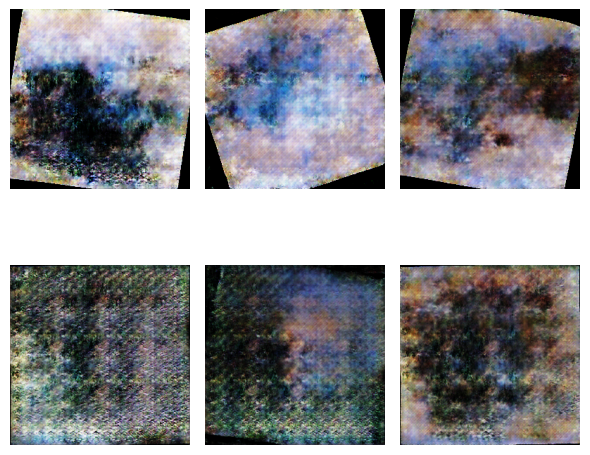

12it [00:00, 11.94it/s]

Epoch [21/200], Step [10/37], D_loss: 0.2229, G_loss: 5.6225


22it [00:01, 11.88it/s]

Epoch [21/200], Step [20/37], D_loss: 0.0401, G_loss: 1.3256


32it [00:02, 11.88it/s]

Epoch [21/200], Step [30/37], D_loss: 0.3591, G_loss: 4.2413


37it [00:03, 12.02it/s]
12it [00:00, 11.94it/s]

Epoch [22/200], Step [10/37], D_loss: 0.3075, G_loss: 4.2101


22it [00:01, 11.87it/s]

Epoch [22/200], Step [20/37], D_loss: 0.0772, G_loss: 7.2900


32it [00:02, 11.81it/s]

Epoch [22/200], Step [30/37], D_loss: 0.0977, G_loss: 3.2353


37it [00:03, 12.02it/s]
12it [00:01, 11.77it/s]

Epoch [23/200], Step [10/37], D_loss: 0.0981, G_loss: 6.3587


22it [00:01, 11.75it/s]

Epoch [23/200], Step [20/37], D_loss: 0.4914, G_loss: 2.9017


32it [00:02, 11.89it/s]

Epoch [23/200], Step [30/37], D_loss: 0.9459, G_loss: 7.8881


37it [00:03, 11.96it/s]
12it [00:00, 11.96it/s]

Epoch [24/200], Step [10/37], D_loss: 0.4180, G_loss: 7.3412


22it [00:01, 11.82it/s]

Epoch [24/200], Step [20/37], D_loss: 0.3398, G_loss: 4.5369


32it [00:02, 11.81it/s]

Epoch [24/200], Step [30/37], D_loss: 0.3124, G_loss: 5.7685


37it [00:03, 12.02it/s]
12it [00:00, 12.03it/s]

Epoch [25/200], Step [10/37], D_loss: 0.2950, G_loss: 1.0219


22it [00:01, 11.88it/s]

Epoch [25/200], Step [20/37], D_loss: 0.0462, G_loss: 4.6536


32it [00:02, 11.88it/s]

Epoch [25/200], Step [30/37], D_loss: 0.0936, G_loss: 2.3800


37it [00:03, 12.04it/s]
12it [00:01, 11.80it/s]

Epoch [26/200], Step [10/37], D_loss: 0.0835, G_loss: 1.6779


22it [00:01, 11.77it/s]

Epoch [26/200], Step [20/37], D_loss: 0.0734, G_loss: 5.6716


32it [00:02, 11.72it/s]

Epoch [26/200], Step [30/37], D_loss: 0.0978, G_loss: 4.3705


37it [00:03, 11.97it/s]
12it [00:01, 11.84it/s]

Epoch [27/200], Step [10/37], D_loss: 0.2065, G_loss: 4.6938


22it [00:01, 11.75it/s]

Epoch [27/200], Step [20/37], D_loss: 0.0296, G_loss: 1.4389


32it [00:02, 11.66it/s]

Epoch [27/200], Step [30/37], D_loss: 0.0069, G_loss: 6.4002


37it [00:03, 11.91it/s]
12it [00:01, 11.73it/s]

Epoch [28/200], Step [10/37], D_loss: 0.0583, G_loss: 4.5092


22it [00:01, 11.78it/s]

Epoch [28/200], Step [20/37], D_loss: 0.0998, G_loss: 3.0933


32it [00:02, 11.72it/s]

Epoch [28/200], Step [30/37], D_loss: 0.3436, G_loss: 3.0072


37it [00:03, 11.92it/s]
12it [00:01, 11.80it/s]

Epoch [29/200], Step [10/37], D_loss: 1.0484, G_loss: 2.0044


22it [00:01, 11.82it/s]

Epoch [29/200], Step [20/37], D_loss: 0.3802, G_loss: 2.7911


32it [00:02, 11.83it/s]

Epoch [29/200], Step [30/37], D_loss: 0.5410, G_loss: 4.5613


37it [00:03, 11.92it/s]
12it [00:01, 11.91it/s]

Epoch [30/200], Step [10/37], D_loss: 0.4149, G_loss: 1.9857


22it [00:01, 11.73it/s]

Epoch [30/200], Step [20/37], D_loss: 0.2081, G_loss: 0.7626


32it [00:02, 11.74it/s]

Epoch [30/200], Step [30/37], D_loss: 0.4128, G_loss: 4.6660


37it [00:03, 11.89it/s]


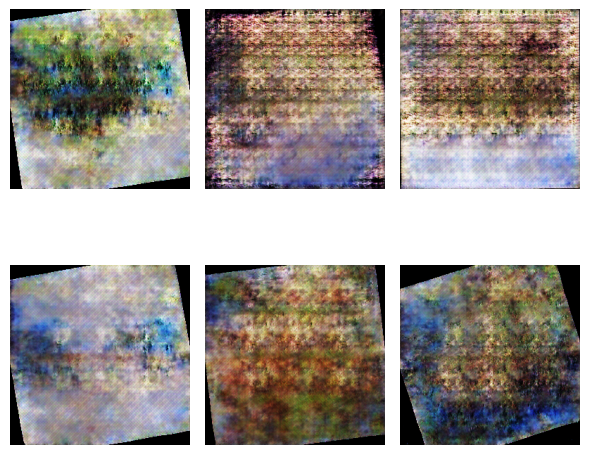

12it [00:01, 11.75it/s]

Epoch [31/200], Step [10/37], D_loss: 0.0981, G_loss: 7.0430


22it [00:01, 11.72it/s]

Epoch [31/200], Step [20/37], D_loss: 2.0971, G_loss: 0.6156


32it [00:02, 11.73it/s]

Epoch [31/200], Step [30/37], D_loss: 0.0649, G_loss: 2.4924


37it [00:03, 11.89it/s]
12it [00:01, 11.78it/s]

Epoch [32/200], Step [10/37], D_loss: 0.1516, G_loss: 5.4484


22it [00:01, 11.70it/s]

Epoch [32/200], Step [20/37], D_loss: 0.2146, G_loss: 5.1235


32it [00:02, 11.63it/s]

Epoch [32/200], Step [30/37], D_loss: 0.8936, G_loss: 1.7244


37it [00:03, 11.86it/s]
12it [00:01, 11.86it/s]

Epoch [33/200], Step [10/37], D_loss: 0.0807, G_loss: 0.4067


22it [00:01, 11.72it/s]

Epoch [33/200], Step [20/37], D_loss: 0.0220, G_loss: 4.6347


32it [00:02, 11.72it/s]

Epoch [33/200], Step [30/37], D_loss: 0.0765, G_loss: 4.2001


37it [00:03, 11.87it/s]
12it [00:01, 11.67it/s]

Epoch [34/200], Step [10/37], D_loss: 0.0323, G_loss: 2.3779


22it [00:01, 11.70it/s]

Epoch [34/200], Step [20/37], D_loss: 0.2436, G_loss: 4.1065


32it [00:02, 11.73it/s]

Epoch [34/200], Step [30/37], D_loss: 0.1987, G_loss: 3.7087


37it [00:03, 11.83it/s]
12it [00:01, 11.81it/s]

Epoch [35/200], Step [10/37], D_loss: 0.0463, G_loss: 6.9723


22it [00:01, 11.77it/s]

Epoch [35/200], Step [20/37], D_loss: 0.6403, G_loss: 3.8407


32it [00:02, 11.72it/s]

Epoch [35/200], Step [30/37], D_loss: 0.2639, G_loss: 3.0486


37it [00:03, 11.87it/s]
12it [00:01, 11.88it/s]

Epoch [36/200], Step [10/37], D_loss: 0.6914, G_loss: 6.2529


22it [00:01, 11.68it/s]

Epoch [36/200], Step [20/37], D_loss: 2.4125, G_loss: 4.8288


32it [00:02, 11.76it/s]

Epoch [36/200], Step [30/37], D_loss: 0.0394, G_loss: 8.2769


37it [00:03, 11.85it/s]
12it [00:01, 11.67it/s]

Epoch [37/200], Step [10/37], D_loss: 0.0122, G_loss: 3.6338


22it [00:01, 11.67it/s]

Epoch [37/200], Step [20/37], D_loss: 0.1105, G_loss: 3.2374


32it [00:02, 11.75it/s]

Epoch [37/200], Step [30/37], D_loss: 0.1139, G_loss: 4.1690


37it [00:03, 11.80it/s]
12it [00:01, 11.77it/s]

Epoch [38/200], Step [10/37], D_loss: 0.8171, G_loss: 2.3644


22it [00:01, 11.72it/s]

Epoch [38/200], Step [20/37], D_loss: 0.0159, G_loss: 3.7308


32it [00:02, 11.64it/s]

Epoch [38/200], Step [30/37], D_loss: 0.5413, G_loss: 5.7657


37it [00:03, 11.82it/s]
12it [00:01, 11.82it/s]

Epoch [39/200], Step [10/37], D_loss: 0.9197, G_loss: 6.3000


22it [00:01, 11.58it/s]

Epoch [39/200], Step [20/37], D_loss: 0.8093, G_loss: 2.7978


32it [00:02, 11.74it/s]

Epoch [39/200], Step [30/37], D_loss: 0.2988, G_loss: 9.0016


37it [00:03, 11.83it/s]
12it [00:01, 11.77it/s]

Epoch [40/200], Step [10/37], D_loss: 0.0646, G_loss: 2.9964


22it [00:01, 11.73it/s]

Epoch [40/200], Step [20/37], D_loss: 1.1074, G_loss: 2.2629


32it [00:02, 11.66it/s]

Epoch [40/200], Step [30/37], D_loss: 1.8999, G_loss: 2.7703


37it [00:03, 11.83it/s]


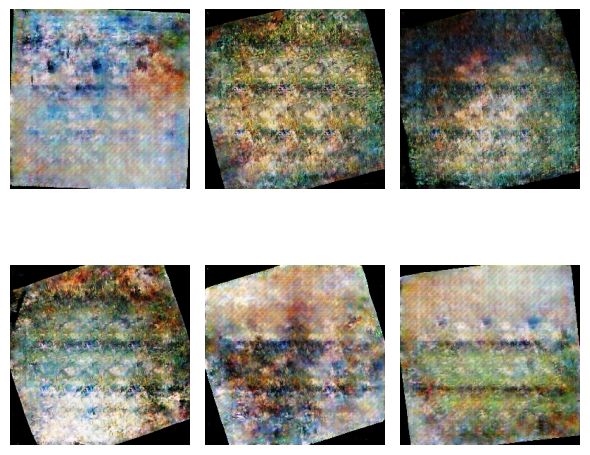

12it [00:01, 11.75it/s]

Epoch [41/200], Step [10/37], D_loss: 1.2864, G_loss: 3.2198


22it [00:01, 11.71it/s]

Epoch [41/200], Step [20/37], D_loss: 0.2249, G_loss: 4.0528


32it [00:02, 11.73it/s]

Epoch [41/200], Step [30/37], D_loss: 0.0493, G_loss: 1.4404


37it [00:03, 11.84it/s]
12it [00:01, 11.73it/s]

Epoch [42/200], Step [10/37], D_loss: 0.0304, G_loss: 5.9405


22it [00:01, 11.66it/s]

Epoch [42/200], Step [20/37], D_loss: 0.0260, G_loss: 5.3866


32it [00:02, 11.70it/s]

Epoch [42/200], Step [30/37], D_loss: 0.5903, G_loss: 2.9919


37it [00:03, 11.84it/s]
12it [00:01, 11.78it/s]

Epoch [43/200], Step [10/37], D_loss: 0.1561, G_loss: 4.3993


22it [00:01, 11.64it/s]

Epoch [43/200], Step [20/37], D_loss: 1.0023, G_loss: 3.4628


32it [00:02, 11.49it/s]

Epoch [43/200], Step [30/37], D_loss: 0.2106, G_loss: 3.7339


37it [00:03, 11.76it/s]
12it [00:01, 11.88it/s]

Epoch [44/200], Step [10/37], D_loss: 0.3382, G_loss: 5.2166


22it [00:01, 11.73it/s]

Epoch [44/200], Step [20/37], D_loss: 0.1011, G_loss: 3.0683


32it [00:02, 11.79it/s]

Epoch [44/200], Step [30/37], D_loss: 0.7612, G_loss: 1.7864


37it [00:03, 11.90it/s]
12it [00:01, 11.81it/s]

Epoch [45/200], Step [10/37], D_loss: 0.4480, G_loss: 5.9160


22it [00:01, 11.74it/s]

Epoch [45/200], Step [20/37], D_loss: 0.0258, G_loss: 0.9458


32it [00:02, 11.67it/s]

Epoch [45/200], Step [30/37], D_loss: 0.9632, G_loss: 1.3193


37it [00:03, 11.86it/s]
12it [00:01, 11.82it/s]

Epoch [46/200], Step [10/37], D_loss: 0.0015, G_loss: 5.2410


22it [00:01, 11.53it/s]

Epoch [46/200], Step [20/37], D_loss: 0.4582, G_loss: 3.7648


32it [00:02, 11.58it/s]

Epoch [46/200], Step [30/37], D_loss: 0.3553, G_loss: 4.4803


37it [00:03, 11.81it/s]
12it [00:01, 11.78it/s]

Epoch [47/200], Step [10/37], D_loss: 0.1622, G_loss: 1.7634


22it [00:01, 11.83it/s]

Epoch [47/200], Step [20/37], D_loss: 0.0316, G_loss: 2.4479


32it [00:02, 11.68it/s]

Epoch [47/200], Step [30/37], D_loss: 0.1799, G_loss: 6.8211


37it [00:03, 11.87it/s]
12it [00:01, 11.79it/s]

Epoch [48/200], Step [10/37], D_loss: 0.5362, G_loss: 0.3047


22it [00:01, 11.74it/s]

Epoch [48/200], Step [20/37], D_loss: 0.4644, G_loss: 3.6002


32it [00:02, 11.74it/s]

Epoch [48/200], Step [30/37], D_loss: 0.1070, G_loss: 6.7961


37it [00:03, 11.85it/s]
12it [00:01, 11.87it/s]

Epoch [49/200], Step [10/37], D_loss: 0.0462, G_loss: 3.7154


22it [00:01, 11.84it/s]

Epoch [49/200], Step [20/37], D_loss: 0.1887, G_loss: 0.6604


32it [00:02, 11.78it/s]

Epoch [49/200], Step [30/37], D_loss: 0.3770, G_loss: 1.4025


37it [00:03, 11.93it/s]
12it [00:01, 11.88it/s]

Epoch [50/200], Step [10/37], D_loss: 0.0380, G_loss: 0.9497


22it [00:01, 11.73it/s]

Epoch [50/200], Step [20/37], D_loss: 0.3951, G_loss: 4.6902


32it [00:02, 11.70it/s]

Epoch [50/200], Step [30/37], D_loss: 1.5583, G_loss: 4.7039


37it [00:03, 11.91it/s]


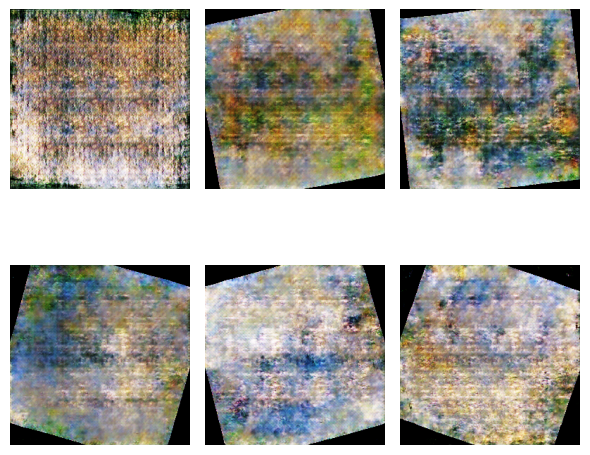

12it [00:01, 11.81it/s]

Epoch [51/200], Step [10/37], D_loss: 0.1166, G_loss: 6.0059


22it [00:01, 11.79it/s]

Epoch [51/200], Step [20/37], D_loss: 0.2325, G_loss: 1.9817


32it [00:02, 11.75it/s]

Epoch [51/200], Step [30/37], D_loss: 0.2234, G_loss: 1.5365


37it [00:03, 11.91it/s]
12it [00:01, 11.86it/s]

Epoch [52/200], Step [10/37], D_loss: 0.3891, G_loss: 3.4784


22it [00:01, 11.83it/s]

Epoch [52/200], Step [20/37], D_loss: 0.4804, G_loss: 6.4508


32it [00:02, 11.83it/s]

Epoch [52/200], Step [30/37], D_loss: 1.0389, G_loss: 4.8362


37it [00:03, 11.91it/s]
12it [00:01, 11.78it/s]

Epoch [53/200], Step [10/37], D_loss: 0.8550, G_loss: 2.7993


22it [00:01, 11.71it/s]

Epoch [53/200], Step [20/37], D_loss: 0.1261, G_loss: 2.8611


32it [00:02, 11.79it/s]

Epoch [53/200], Step [30/37], D_loss: 0.8538, G_loss: 4.8663


37it [00:03, 11.90it/s]
12it [00:01, 11.89it/s]

Epoch [54/200], Step [10/37], D_loss: 0.2972, G_loss: 5.6725


22it [00:01, 11.79it/s]

Epoch [54/200], Step [20/37], D_loss: 0.1394, G_loss: 2.5285


32it [00:02, 11.71it/s]

Epoch [54/200], Step [30/37], D_loss: 0.0377, G_loss: 5.2756


37it [00:03, 11.90it/s]
12it [00:01, 11.85it/s]

Epoch [55/200], Step [10/37], D_loss: 0.0614, G_loss: 3.9750


22it [00:01, 11.86it/s]

Epoch [55/200], Step [20/37], D_loss: 0.2917, G_loss: 3.5313


32it [00:02, 11.75it/s]

Epoch [55/200], Step [30/37], D_loss: 0.0935, G_loss: 7.9525


37it [00:03, 11.93it/s]
12it [00:01, 11.78it/s]

Epoch [56/200], Step [10/37], D_loss: 0.1302, G_loss: 4.2244


22it [00:01, 11.72it/s]

Epoch [56/200], Step [20/37], D_loss: 1.7148, G_loss: 1.0195


32it [00:02, 11.70it/s]

Epoch [56/200], Step [30/37], D_loss: 0.1540, G_loss: 4.7845


37it [00:03, 11.88it/s]
12it [00:01, 11.88it/s]

Epoch [57/200], Step [10/37], D_loss: 0.3061, G_loss: 3.8345


22it [00:01, 11.70it/s]

Epoch [57/200], Step [20/37], D_loss: 0.0771, G_loss: 4.1135


32it [00:02, 11.72it/s]

Epoch [57/200], Step [30/37], D_loss: 0.1828, G_loss: 1.3783


37it [00:03, 11.91it/s]
12it [00:01, 11.79it/s]

Epoch [58/200], Step [10/37], D_loss: 1.6151, G_loss: 4.7614


22it [00:01, 11.74it/s]

Epoch [58/200], Step [20/37], D_loss: 0.0591, G_loss: 5.3608


32it [00:02, 11.75it/s]

Epoch [58/200], Step [30/37], D_loss: 0.9204, G_loss: 0.4845


37it [00:03, 11.89it/s]
12it [00:01, 11.82it/s]

Epoch [59/200], Step [10/37], D_loss: 0.5562, G_loss: 7.2084


22it [00:01, 11.77it/s]

Epoch [59/200], Step [20/37], D_loss: 0.0547, G_loss: 5.0596


32it [00:02, 11.78it/s]

Epoch [59/200], Step [30/37], D_loss: 0.6285, G_loss: 3.0576


37it [00:03, 11.90it/s]
12it [00:01, 11.82it/s]

Epoch [60/200], Step [10/37], D_loss: 0.0637, G_loss: 5.5850


22it [00:01, 11.75it/s]

Epoch [60/200], Step [20/37], D_loss: 0.5912, G_loss: 0.7069


32it [00:02, 11.78it/s]

Epoch [60/200], Step [30/37], D_loss: 1.5948, G_loss: 1.9287


37it [00:03, 11.89it/s]


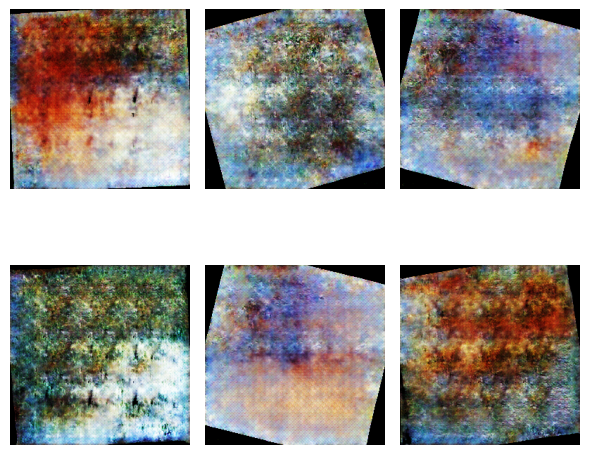

12it [00:01, 11.79it/s]

Epoch [61/200], Step [10/37], D_loss: 0.6826, G_loss: 2.3971


22it [00:01, 11.71it/s]

Epoch [61/200], Step [20/37], D_loss: 0.2295, G_loss: 3.9561


32it [00:02, 11.78it/s]

Epoch [61/200], Step [30/37], D_loss: 0.0322, G_loss: 1.7964


37it [00:03, 11.88it/s]
12it [00:01, 11.83it/s]

Epoch [62/200], Step [10/37], D_loss: 0.1706, G_loss: 3.1344


22it [00:01, 11.74it/s]

Epoch [62/200], Step [20/37], D_loss: 0.5777, G_loss: 3.9131


32it [00:02, 11.63it/s]

Epoch [62/200], Step [30/37], D_loss: 0.3554, G_loss: 4.1959


37it [00:03, 11.81it/s]
12it [00:01, 11.70it/s]

Epoch [63/200], Step [10/37], D_loss: 0.0736, G_loss: 2.5095


22it [00:01, 11.76it/s]

Epoch [63/200], Step [20/37], D_loss: 0.0414, G_loss: 2.1499


32it [00:02, 11.71it/s]

Epoch [63/200], Step [30/37], D_loss: 1.0027, G_loss: 4.2712


37it [00:03, 11.87it/s]
12it [00:01, 11.78it/s]

Epoch [64/200], Step [10/37], D_loss: 1.2477, G_loss: 2.2643


22it [00:01, 11.69it/s]

Epoch [64/200], Step [20/37], D_loss: 0.1600, G_loss: 3.7963


32it [00:02, 11.68it/s]

Epoch [64/200], Step [30/37], D_loss: 0.5882, G_loss: 4.1898


37it [00:03, 11.87it/s]
12it [00:01, 11.83it/s]

Epoch [65/200], Step [10/37], D_loss: 1.4473, G_loss: 4.7802


22it [00:01, 11.85it/s]

Epoch [65/200], Step [20/37], D_loss: 0.4511, G_loss: 5.9324


32it [00:02, 11.81it/s]

Epoch [65/200], Step [30/37], D_loss: 0.4089, G_loss: 4.2736


37it [00:03, 11.92it/s]
12it [00:01, 11.88it/s]

Epoch [66/200], Step [10/37], D_loss: 0.6710, G_loss: 1.9967


22it [00:01, 11.72it/s]

Epoch [66/200], Step [20/37], D_loss: 0.4484, G_loss: 3.9853


32it [00:02, 11.68it/s]

Epoch [66/200], Step [30/37], D_loss: 1.3089, G_loss: 8.7399


37it [00:03, 11.87it/s]
12it [00:01, 11.77it/s]

Epoch [67/200], Step [10/37], D_loss: 0.2077, G_loss: 3.2698


22it [00:01, 11.72it/s]

Epoch [67/200], Step [20/37], D_loss: 0.3345, G_loss: 3.2344


32it [00:02, 11.75it/s]

Epoch [67/200], Step [30/37], D_loss: 0.3443, G_loss: 3.2540


37it [00:03, 11.85it/s]
12it [00:01, 11.81it/s]

Epoch [68/200], Step [10/37], D_loss: 0.8167, G_loss: 3.0233


22it [00:01, 11.74it/s]

Epoch [68/200], Step [20/37], D_loss: 0.6614, G_loss: 1.9478


32it [00:02, 11.73it/s]

Epoch [68/200], Step [30/37], D_loss: 1.4689, G_loss: 4.9857


37it [00:03, 11.86it/s]
12it [00:01, 11.79it/s]

Epoch [69/200], Step [10/37], D_loss: 0.4541, G_loss: 2.0385


22it [00:01, 11.68it/s]

Epoch [69/200], Step [20/37], D_loss: 0.1494, G_loss: 6.8151


32it [00:02, 11.75it/s]

Epoch [69/200], Step [30/37], D_loss: 0.2990, G_loss: 8.6688


37it [00:03, 11.87it/s]
12it [00:01, 11.72it/s]

Epoch [70/200], Step [10/37], D_loss: 0.0490, G_loss: 2.0447


22it [00:01, 11.61it/s]

Epoch [70/200], Step [20/37], D_loss: 0.1442, G_loss: 4.5423


32it [00:02, 11.65it/s]

Epoch [70/200], Step [30/37], D_loss: 0.3245, G_loss: 3.7313


37it [00:03, 11.82it/s]


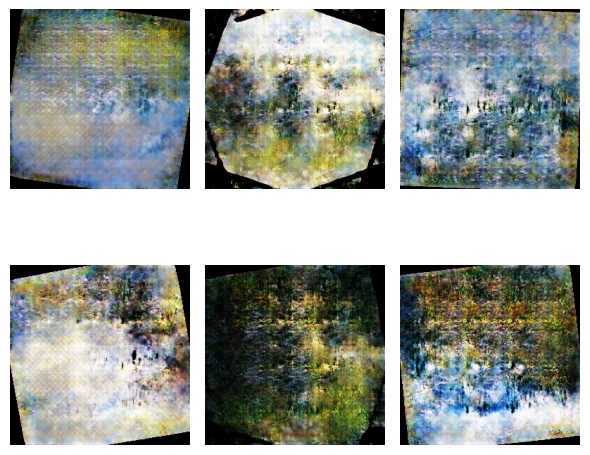

12it [00:01, 11.80it/s]

Epoch [71/200], Step [10/37], D_loss: 0.3170, G_loss: 4.1992


22it [00:01, 11.82it/s]

Epoch [71/200], Step [20/37], D_loss: 0.0717, G_loss: 4.6261


32it [00:02, 11.75it/s]

Epoch [71/200], Step [30/37], D_loss: 1.7698, G_loss: 1.3438


37it [00:03, 11.89it/s]
12it [00:01, 11.79it/s]

Epoch [72/200], Step [10/37], D_loss: 0.0951, G_loss: 7.1610


22it [00:01, 11.72it/s]

Epoch [72/200], Step [20/37], D_loss: 0.6399, G_loss: 6.9336


32it [00:02, 11.69it/s]

Epoch [72/200], Step [30/37], D_loss: 0.3568, G_loss: 4.7767


37it [00:03, 11.83it/s]
12it [00:01, 11.83it/s]

Epoch [73/200], Step [10/37], D_loss: 0.1589, G_loss: 5.9387


22it [00:01, 11.69it/s]

Epoch [73/200], Step [20/37], D_loss: 0.1095, G_loss: 2.9322


32it [00:02, 11.73it/s]

Epoch [73/200], Step [30/37], D_loss: 0.0840, G_loss: 0.8220


37it [00:03, 11.87it/s]
12it [00:01, 11.75it/s]

Epoch [74/200], Step [10/37], D_loss: 0.3998, G_loss: 4.7723


22it [00:01, 11.77it/s]

Epoch [74/200], Step [20/37], D_loss: 0.2034, G_loss: 5.3307


32it [00:02, 11.69it/s]

Epoch [74/200], Step [30/37], D_loss: 0.4002, G_loss: 3.9217


37it [00:03, 11.85it/s]
12it [00:01, 11.77it/s]

Epoch [75/200], Step [10/37], D_loss: 0.2614, G_loss: 2.8780


22it [00:01, 11.67it/s]

Epoch [75/200], Step [20/37], D_loss: 0.1143, G_loss: 0.3613


32it [00:02, 11.73it/s]

Epoch [75/200], Step [30/37], D_loss: 0.1148, G_loss: 5.4030


37it [00:03, 11.83it/s]
12it [00:01, 11.79it/s]

Epoch [76/200], Step [10/37], D_loss: 0.0808, G_loss: 2.0006


22it [00:01, 11.68it/s]

Epoch [76/200], Step [20/37], D_loss: 0.3453, G_loss: 2.8818


32it [00:02, 11.73it/s]

Epoch [76/200], Step [30/37], D_loss: 0.1266, G_loss: 4.7027


37it [00:03, 11.86it/s]
12it [00:01, 11.80it/s]

Epoch [77/200], Step [10/37], D_loss: 1.6616, G_loss: 3.3502


22it [00:01, 11.69it/s]

Epoch [77/200], Step [20/37], D_loss: 0.1249, G_loss: 1.1667


32it [00:02, 11.73it/s]

Epoch [77/200], Step [30/37], D_loss: 0.0142, G_loss: 3.8131


37it [00:03, 11.85it/s]
12it [00:01, 11.80it/s]

Epoch [78/200], Step [10/37], D_loss: 0.1930, G_loss: 4.9816


22it [00:01, 11.75it/s]

Epoch [78/200], Step [20/37], D_loss: 0.3769, G_loss: 6.6243


32it [00:02, 11.69it/s]

Epoch [78/200], Step [30/37], D_loss: 1.7656, G_loss: 5.1070


37it [00:03, 11.87it/s]
12it [00:01, 11.70it/s]

Epoch [79/200], Step [10/37], D_loss: 1.7398, G_loss: 2.5969


22it [00:01, 11.64it/s]

Epoch [79/200], Step [20/37], D_loss: 3.2279, G_loss: 4.5213


32it [00:02, 11.77it/s]

Epoch [79/200], Step [30/37], D_loss: 0.1589, G_loss: 1.3361


37it [00:03, 11.82it/s]
12it [00:01, 11.77it/s]

Epoch [80/200], Step [10/37], D_loss: 0.7863, G_loss: 6.5468


22it [00:01, 11.57it/s]

Epoch [80/200], Step [20/37], D_loss: 1.3344, G_loss: 3.0275


32it [00:02, 11.65it/s]

Epoch [80/200], Step [30/37], D_loss: 0.7272, G_loss: 1.9791


37it [00:03, 11.83it/s]


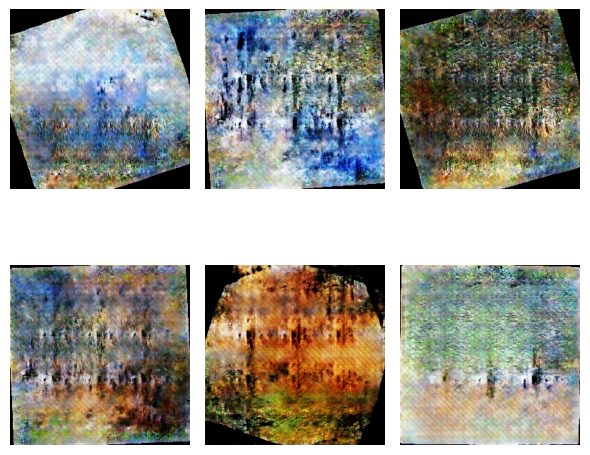

12it [00:01, 11.72it/s]

Epoch [81/200], Step [10/37], D_loss: 0.3908, G_loss: 5.6355


22it [00:01, 11.65it/s]

Epoch [81/200], Step [20/37], D_loss: 0.3523, G_loss: 1.3548


32it [00:02, 11.68it/s]

Epoch [81/200], Step [30/37], D_loss: 0.3707, G_loss: 5.9909


37it [00:03, 11.83it/s]
12it [00:01, 11.70it/s]

Epoch [82/200], Step [10/37], D_loss: 1.2069, G_loss: 4.2545


22it [00:01, 11.50it/s]

Epoch [82/200], Step [20/37], D_loss: 1.4712, G_loss: 6.5485


32it [00:02, 11.62it/s]

Epoch [82/200], Step [30/37], D_loss: 0.0305, G_loss: 3.4805


37it [00:03, 11.76it/s]
12it [00:01, 11.84it/s]

Epoch [83/200], Step [10/37], D_loss: 0.0477, G_loss: 2.9995


22it [00:01, 11.71it/s]

Epoch [83/200], Step [20/37], D_loss: 0.0517, G_loss: 4.7490


32it [00:02, 11.79it/s]

Epoch [83/200], Step [30/37], D_loss: 0.0895, G_loss: 3.9944


37it [00:03, 11.87it/s]
12it [00:01, 11.77it/s]

Epoch [84/200], Step [10/37], D_loss: 0.6139, G_loss: 5.8405


22it [00:01, 11.63it/s]

Epoch [84/200], Step [20/37], D_loss: 0.1714, G_loss: 3.8857


32it [00:02, 11.69it/s]

Epoch [84/200], Step [30/37], D_loss: 0.1239, G_loss: 4.9619


37it [00:03, 11.84it/s]
12it [00:01, 11.83it/s]

Epoch [85/200], Step [10/37], D_loss: 0.1232, G_loss: 1.7772


22it [00:01, 11.72it/s]

Epoch [85/200], Step [20/37], D_loss: 0.4498, G_loss: 6.6663


32it [00:02, 11.67it/s]

Epoch [85/200], Step [30/37], D_loss: 0.9410, G_loss: 9.5124


37it [00:03, 11.84it/s]
12it [00:01, 11.85it/s]

Epoch [86/200], Step [10/37], D_loss: 0.5414, G_loss: 4.5352


22it [00:01, 11.71it/s]

Epoch [86/200], Step [20/37], D_loss: 0.4851, G_loss: 6.3206


32it [00:02, 11.73it/s]

Epoch [86/200], Step [30/37], D_loss: 0.1380, G_loss: 5.2730


37it [00:03, 11.87it/s]
12it [00:01, 11.76it/s]

Epoch [87/200], Step [10/37], D_loss: 0.0761, G_loss: 1.9332


22it [00:01, 11.74it/s]

Epoch [87/200], Step [20/37], D_loss: 0.1530, G_loss: 0.4079


32it [00:02, 11.75it/s]

Epoch [87/200], Step [30/37], D_loss: 0.5153, G_loss: 0.6348


37it [00:03, 11.87it/s]
12it [00:01, 11.80it/s]

Epoch [88/200], Step [10/37], D_loss: 0.4399, G_loss: 2.2599


22it [00:01, 11.78it/s]

Epoch [88/200], Step [20/37], D_loss: 0.0720, G_loss: 2.8004


32it [00:02, 11.78it/s]

Epoch [88/200], Step [30/37], D_loss: 0.2964, G_loss: 4.1083


37it [00:03, 11.89it/s]
12it [00:01, 11.81it/s]

Epoch [89/200], Step [10/37], D_loss: 0.4085, G_loss: 2.3630


22it [00:01, 11.70it/s]

Epoch [89/200], Step [20/37], D_loss: 0.0810, G_loss: 0.4307


32it [00:02, 11.76it/s]

Epoch [89/200], Step [30/37], D_loss: 0.1037, G_loss: 0.9299


37it [00:03, 11.88it/s]
12it [00:01, 11.81it/s]

Epoch [90/200], Step [10/37], D_loss: 0.1667, G_loss: 5.3406


22it [00:01, 11.75it/s]

Epoch [90/200], Step [20/37], D_loss: 0.1208, G_loss: 3.5704


32it [00:02, 11.69it/s]

Epoch [90/200], Step [30/37], D_loss: 0.1676, G_loss: 6.1096


37it [00:03, 11.84it/s]


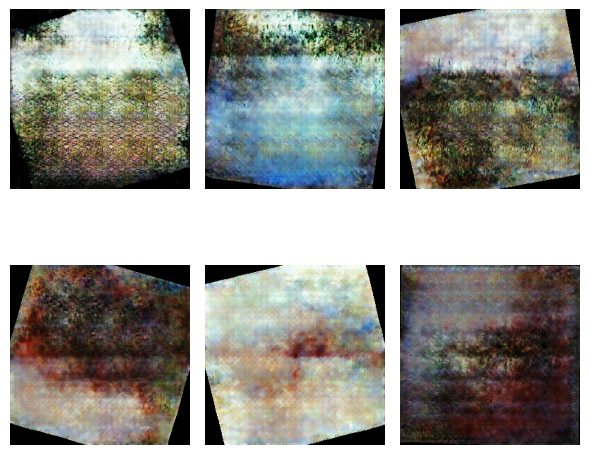

12it [00:01, 11.75it/s]

Epoch [91/200], Step [10/37], D_loss: 0.3983, G_loss: 4.4053


22it [00:01, 11.80it/s]

Epoch [91/200], Step [20/37], D_loss: 0.1656, G_loss: 3.4869


32it [00:02, 11.67it/s]

Epoch [91/200], Step [30/37], D_loss: 0.2860, G_loss: 2.5808


37it [00:03, 11.88it/s]
12it [00:01, 11.77it/s]

Epoch [92/200], Step [10/37], D_loss: 0.8485, G_loss: 5.5065


22it [00:01, 11.63it/s]

Epoch [92/200], Step [20/37], D_loss: 0.0702, G_loss: 1.5534


32it [00:02, 11.65it/s]

Epoch [92/200], Step [30/37], D_loss: 1.0806, G_loss: 2.9159


37it [00:03, 11.84it/s]
12it [00:01, 11.83it/s]

Epoch [93/200], Step [10/37], D_loss: 0.6500, G_loss: 0.8906


22it [00:01, 11.73it/s]

Epoch [93/200], Step [20/37], D_loss: 0.0815, G_loss: 1.8196


32it [00:02, 11.75it/s]

Epoch [93/200], Step [30/37], D_loss: 0.0571, G_loss: 3.0235


37it [00:03, 11.87it/s]
12it [00:01, 11.82it/s]

Epoch [94/200], Step [10/37], D_loss: 0.1800, G_loss: 1.5796


22it [00:01, 11.77it/s]

Epoch [94/200], Step [20/37], D_loss: 0.1302, G_loss: 3.3725


32it [00:02, 11.80it/s]

Epoch [94/200], Step [30/37], D_loss: 0.9908, G_loss: 2.2901


37it [00:03, 11.87it/s]
12it [00:01, 11.85it/s]

Epoch [95/200], Step [10/37], D_loss: 0.1477, G_loss: 3.8529


22it [00:01, 11.73it/s]

Epoch [95/200], Step [20/37], D_loss: 0.0887, G_loss: 4.6689


32it [00:02, 11.76it/s]

Epoch [95/200], Step [30/37], D_loss: 0.6557, G_loss: 6.9661


37it [00:03, 11.92it/s]
12it [00:01, 11.86it/s]

Epoch [96/200], Step [10/37], D_loss: 0.1169, G_loss: 3.6636


22it [00:01, 11.79it/s]

Epoch [96/200], Step [20/37], D_loss: 0.1802, G_loss: 5.7733


32it [00:02, 11.69it/s]

Epoch [96/200], Step [30/37], D_loss: 0.2756, G_loss: 5.9307


37it [00:03, 11.89it/s]
12it [00:01, 11.84it/s]

Epoch [97/200], Step [10/37], D_loss: 0.0864, G_loss: 2.3410


22it [00:01, 11.75it/s]

Epoch [97/200], Step [20/37], D_loss: 1.0773, G_loss: 1.3321


32it [00:02, 11.78it/s]

Epoch [97/200], Step [30/37], D_loss: 0.2750, G_loss: 0.7913


37it [00:03, 11.91it/s]
12it [00:01, 11.77it/s]

Epoch [98/200], Step [10/37], D_loss: 0.3241, G_loss: 4.3551


22it [00:01, 11.77it/s]

Epoch [98/200], Step [20/37], D_loss: 0.1657, G_loss: 8.2732


32it [00:02, 11.72it/s]

Epoch [98/200], Step [30/37], D_loss: 0.3023, G_loss: 4.7631


37it [00:03, 11.87it/s]
12it [00:01, 11.76it/s]

Epoch [99/200], Step [10/37], D_loss: 0.0687, G_loss: 3.4824


22it [00:01, 11.73it/s]

Epoch [99/200], Step [20/37], D_loss: 0.2750, G_loss: 1.9911


32it [00:02, 11.72it/s]

Epoch [99/200], Step [30/37], D_loss: 1.5536, G_loss: 4.0507


37it [00:03, 11.89it/s]
12it [00:01, 11.78it/s]

Epoch [100/200], Step [10/37], D_loss: 0.4770, G_loss: 3.6576


22it [00:01, 11.75it/s]

Epoch [100/200], Step [20/37], D_loss: 0.9893, G_loss: 3.0375


32it [00:02, 11.76it/s]

Epoch [100/200], Step [30/37], D_loss: 0.5503, G_loss: 5.0625


37it [00:03, 11.86it/s]


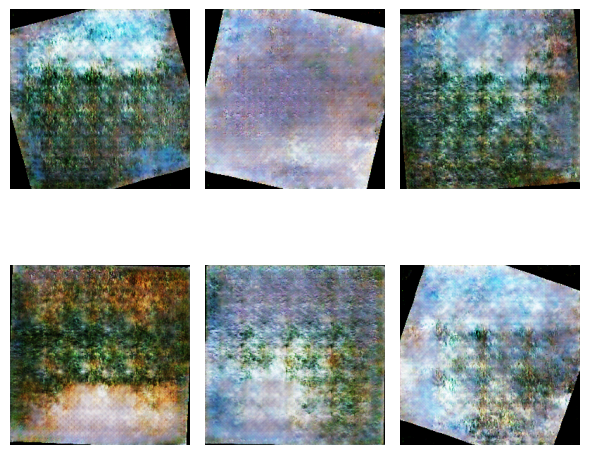

12it [00:01, 11.78it/s]

Epoch [101/200], Step [10/37], D_loss: 0.0520, G_loss: 3.8088


22it [00:01, 11.79it/s]

Epoch [101/200], Step [20/37], D_loss: 0.1139, G_loss: 4.3684


32it [00:02, 11.80it/s]

Epoch [101/200], Step [30/37], D_loss: 0.1907, G_loss: 2.7836


37it [00:03, 11.92it/s]
12it [00:01, 11.85it/s]

Epoch [102/200], Step [10/37], D_loss: 1.1310, G_loss: 4.7162


22it [00:01, 11.75it/s]

Epoch [102/200], Step [20/37], D_loss: 0.0872, G_loss: 2.9264


32it [00:02, 11.64it/s]

Epoch [102/200], Step [30/37], D_loss: 0.4112, G_loss: 2.8781


37it [00:03, 11.86it/s]
12it [00:01, 11.65it/s]

Epoch [103/200], Step [10/37], D_loss: 1.9641, G_loss: 3.7300


22it [00:01, 11.65it/s]

Epoch [103/200], Step [20/37], D_loss: 0.0759, G_loss: 0.8618


32it [00:02, 11.68it/s]

Epoch [103/200], Step [30/37], D_loss: 0.3491, G_loss: 1.0345


37it [00:03, 11.86it/s]
12it [00:01, 11.68it/s]

Epoch [104/200], Step [10/37], D_loss: 0.8241, G_loss: 2.7017


22it [00:01, 11.68it/s]

Epoch [104/200], Step [20/37], D_loss: 0.2764, G_loss: 4.1911


32it [00:02, 11.70it/s]

Epoch [104/200], Step [30/37], D_loss: 0.6634, G_loss: 2.2711


37it [00:03, 11.84it/s]
12it [00:01, 11.66it/s]

Epoch [105/200], Step [10/37], D_loss: 0.6784, G_loss: 2.3649


22it [00:01, 11.73it/s]

Epoch [105/200], Step [20/37], D_loss: 0.3536, G_loss: 6.3378


32it [00:02, 11.79it/s]

Epoch [105/200], Step [30/37], D_loss: 0.0854, G_loss: 10.0939


37it [00:03, 11.86it/s]
12it [00:01, 11.80it/s]

Epoch [106/200], Step [10/37], D_loss: 0.2857, G_loss: 3.4358


22it [00:01, 11.74it/s]

Epoch [106/200], Step [20/37], D_loss: 1.2824, G_loss: 6.3274


32it [00:02, 11.80it/s]

Epoch [106/200], Step [30/37], D_loss: 0.9553, G_loss: 5.2258


37it [00:03, 11.89it/s]
12it [00:01, 11.80it/s]

Epoch [107/200], Step [10/37], D_loss: 0.2030, G_loss: 5.2259


22it [00:01, 11.73it/s]

Epoch [107/200], Step [20/37], D_loss: 2.5450, G_loss: 7.6756


32it [00:02, 11.77it/s]

Epoch [107/200], Step [30/37], D_loss: 1.1572, G_loss: 2.7682


37it [00:03, 11.90it/s]
12it [00:01, 11.84it/s]

Epoch [108/200], Step [10/37], D_loss: 0.0352, G_loss: 4.5724


22it [00:01, 11.82it/s]

Epoch [108/200], Step [20/37], D_loss: 0.3566, G_loss: 4.3096


32it [00:02, 11.71it/s]

Epoch [108/200], Step [30/37], D_loss: 0.5842, G_loss: 3.7957


37it [00:03, 11.90it/s]
12it [00:01, 11.81it/s]

Epoch [109/200], Step [10/37], D_loss: 0.0692, G_loss: 4.8425


22it [00:01, 11.78it/s]

Epoch [109/200], Step [20/37], D_loss: 0.4308, G_loss: 5.7311


32it [00:02, 11.73it/s]

Epoch [109/200], Step [30/37], D_loss: 0.0704, G_loss: 5.4002


37it [00:03, 11.89it/s]
12it [00:01, 11.78it/s]

Epoch [110/200], Step [10/37], D_loss: 0.0608, G_loss: 5.2570


22it [00:01, 11.70it/s]

Epoch [110/200], Step [20/37], D_loss: 1.5086, G_loss: 7.6466


32it [00:02, 11.70it/s]

Epoch [110/200], Step [30/37], D_loss: 1.3623, G_loss: 6.3110


37it [00:03, 11.87it/s]


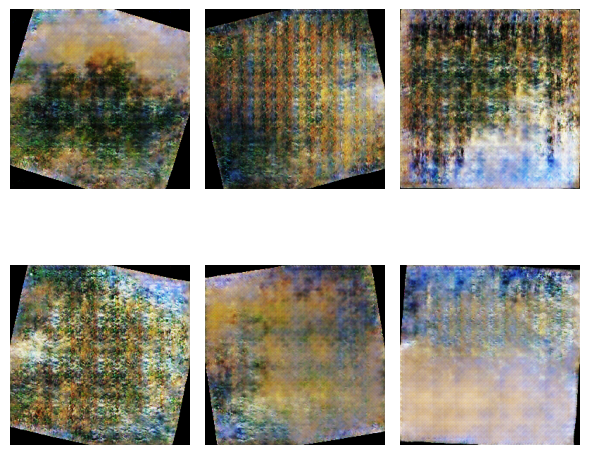

12it [00:01, 11.78it/s]

Epoch [111/200], Step [10/37], D_loss: 0.2890, G_loss: 7.4928


22it [00:01, 11.61it/s]

Epoch [111/200], Step [20/37], D_loss: 0.6801, G_loss: 1.9863


32it [00:02, 11.81it/s]

Epoch [111/200], Step [30/37], D_loss: 0.8771, G_loss: 4.7711


37it [00:03, 11.88it/s]
12it [00:01, 11.66it/s]

Epoch [112/200], Step [10/37], D_loss: 1.1209, G_loss: 4.5944


22it [00:01, 11.55it/s]

Epoch [112/200], Step [20/37], D_loss: 0.0850, G_loss: 1.4549


32it [00:02, 11.68it/s]

Epoch [112/200], Step [30/37], D_loss: 0.4948, G_loss: 6.9293


37it [00:03, 11.81it/s]
12it [00:01, 11.83it/s]

Epoch [113/200], Step [10/37], D_loss: 0.4851, G_loss: 2.0396


22it [00:01, 11.79it/s]

Epoch [113/200], Step [20/37], D_loss: 0.8938, G_loss: 3.3075


32it [00:02, 11.80it/s]

Epoch [113/200], Step [30/37], D_loss: 0.7063, G_loss: 5.8810


37it [00:03, 11.91it/s]
12it [00:01, 11.79it/s]

Epoch [114/200], Step [10/37], D_loss: 0.0133, G_loss: 4.5435


22it [00:01, 11.71it/s]

Epoch [114/200], Step [20/37], D_loss: 0.7521, G_loss: 3.5849


32it [00:02, 11.73it/s]

Epoch [114/200], Step [30/37], D_loss: 0.0841, G_loss: 1.3314


37it [00:03, 11.89it/s]
12it [00:01, 11.81it/s]

Epoch [115/200], Step [10/37], D_loss: 0.7386, G_loss: 8.9372


22it [00:01, 11.73it/s]

Epoch [115/200], Step [20/37], D_loss: 0.0569, G_loss: 8.2527


32it [00:02, 11.74it/s]

Epoch [115/200], Step [30/37], D_loss: 0.2165, G_loss: 5.5280


37it [00:03, 11.89it/s]
12it [00:01, 11.86it/s]

Epoch [116/200], Step [10/37], D_loss: 0.9622, G_loss: 2.0407


22it [00:01, 11.76it/s]

Epoch [116/200], Step [20/37], D_loss: 0.1217, G_loss: 4.0435


32it [00:02, 11.70it/s]

Epoch [116/200], Step [30/37], D_loss: 1.0064, G_loss: 4.4994


37it [00:03, 11.89it/s]
12it [00:01, 11.85it/s]

Epoch [117/200], Step [10/37], D_loss: 0.5164, G_loss: 2.9528


22it [00:01, 11.83it/s]

Epoch [117/200], Step [20/37], D_loss: 0.1408, G_loss: 3.0279


32it [00:02, 11.78it/s]

Epoch [117/200], Step [30/37], D_loss: 0.0111, G_loss: 1.2218


37it [00:03, 11.91it/s]
12it [00:01, 11.84it/s]

Epoch [118/200], Step [10/37], D_loss: 0.0787, G_loss: 0.2243


22it [00:01, 11.74it/s]

Epoch [118/200], Step [20/37], D_loss: 0.0156, G_loss: 4.9210


32it [00:02, 11.81it/s]

Epoch [118/200], Step [30/37], D_loss: 0.0406, G_loss: 9.3881


37it [00:03, 11.89it/s]
12it [00:01, 11.79it/s]

Epoch [119/200], Step [10/37], D_loss: 0.4727, G_loss: 5.1615


22it [00:01, 11.72it/s]

Epoch [119/200], Step [20/37], D_loss: 0.1402, G_loss: 3.8346


32it [00:02, 11.64it/s]

Epoch [119/200], Step [30/37], D_loss: 0.4686, G_loss: 1.0348


37it [00:03, 11.86it/s]
12it [00:01, 11.82it/s]

Epoch [120/200], Step [10/37], D_loss: 0.7417, G_loss: 3.9254


22it [00:01, 11.76it/s]

Epoch [120/200], Step [20/37], D_loss: 0.0594, G_loss: 3.7756


32it [00:02, 11.78it/s]

Epoch [120/200], Step [30/37], D_loss: 1.9750, G_loss: 2.5801


37it [00:03, 11.89it/s]


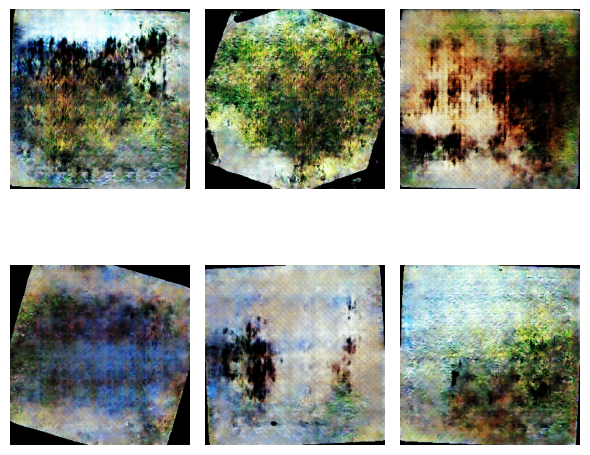

12it [00:01, 11.71it/s]

Epoch [121/200], Step [10/37], D_loss: 0.2337, G_loss: 1.4137


22it [00:01, 11.76it/s]

Epoch [121/200], Step [20/37], D_loss: 0.6529, G_loss: 3.6259


32it [00:02, 11.72it/s]

Epoch [121/200], Step [30/37], D_loss: 1.4187, G_loss: 2.1632


37it [00:03, 11.84it/s]
12it [00:01, 11.89it/s]

Epoch [122/200], Step [10/37], D_loss: 1.3100, G_loss: 2.3014


22it [00:01, 11.57it/s]

Epoch [122/200], Step [20/37], D_loss: 0.9134, G_loss: 6.7206


32it [00:02, 11.73it/s]

Epoch [122/200], Step [30/37], D_loss: 0.2691, G_loss: 6.2146


37it [00:03, 11.85it/s]
12it [00:01, 11.75it/s]

Epoch [123/200], Step [10/37], D_loss: 1.4203, G_loss: 3.8758


22it [00:01, 11.64it/s]

Epoch [123/200], Step [20/37], D_loss: 0.5408, G_loss: 3.4570


32it [00:02, 11.72it/s]

Epoch [123/200], Step [30/37], D_loss: 0.4236, G_loss: 2.0690


37it [00:03, 11.87it/s]
12it [00:01, 11.68it/s]

Epoch [124/200], Step [10/37], D_loss: 0.1396, G_loss: 2.3121


22it [00:01, 11.74it/s]

Epoch [124/200], Step [20/37], D_loss: 0.2337, G_loss: 0.0808


32it [00:02, 11.73it/s]

Epoch [124/200], Step [30/37], D_loss: 0.0616, G_loss: 1.8883


37it [00:03, 11.86it/s]
12it [00:01, 11.90it/s]

Epoch [125/200], Step [10/37], D_loss: 0.0647, G_loss: 3.9793


22it [00:01, 11.79it/s]

Epoch [125/200], Step [20/37], D_loss: 0.3586, G_loss: 1.9165


32it [00:02, 11.70it/s]

Epoch [125/200], Step [30/37], D_loss: 0.1242, G_loss: 3.7248


37it [00:03, 11.90it/s]
12it [00:01, 11.72it/s]

Epoch [126/200], Step [10/37], D_loss: 0.2744, G_loss: 3.6408


22it [00:01, 11.75it/s]

Epoch [126/200], Step [20/37], D_loss: 0.3146, G_loss: 0.9354


32it [00:02, 11.73it/s]

Epoch [126/200], Step [30/37], D_loss: 0.5354, G_loss: 2.6899


37it [00:03, 11.88it/s]
12it [00:01, 11.80it/s]

Epoch [127/200], Step [10/37], D_loss: 0.0446, G_loss: 1.3352


22it [00:01, 11.81it/s]

Epoch [127/200], Step [20/37], D_loss: 0.1180, G_loss: 1.8297


32it [00:02, 11.83it/s]

Epoch [127/200], Step [30/37], D_loss: 0.2197, G_loss: 3.1380


37it [00:03, 11.92it/s]
12it [00:01, 11.83it/s]

Epoch [128/200], Step [10/37], D_loss: 0.0529, G_loss: 4.9704


22it [00:01, 11.70it/s]

Epoch [128/200], Step [20/37], D_loss: 0.1088, G_loss: 8.4151


32it [00:02, 11.74it/s]

Epoch [128/200], Step [30/37], D_loss: 0.1437, G_loss: 6.7591


37it [00:03, 11.87it/s]
12it [00:01, 11.89it/s]

Epoch [129/200], Step [10/37], D_loss: 0.0328, G_loss: 2.2848


22it [00:01, 11.72it/s]

Epoch [129/200], Step [20/37], D_loss: 0.2801, G_loss: 4.6546


32it [00:02, 11.77it/s]

Epoch [129/200], Step [30/37], D_loss: 0.0086, G_loss: 3.6235


37it [00:03, 11.90it/s]
12it [00:01, 11.94it/s]

Epoch [130/200], Step [10/37], D_loss: 0.5393, G_loss: 6.1047


22it [00:01, 11.73it/s]

Epoch [130/200], Step [20/37], D_loss: 0.7157, G_loss: 1.9239


32it [00:02, 11.68it/s]

Epoch [130/200], Step [30/37], D_loss: 0.6688, G_loss: 0.8587


37it [00:03, 11.90it/s]


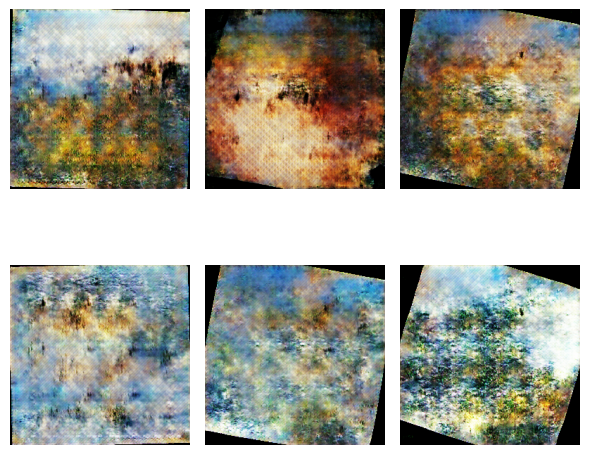

12it [00:01, 11.88it/s]

Epoch [131/200], Step [10/37], D_loss: 0.1639, G_loss: 1.5693


22it [00:01, 11.78it/s]

Epoch [131/200], Step [20/37], D_loss: 0.3082, G_loss: 4.1365


32it [00:02, 11.71it/s]

Epoch [131/200], Step [30/37], D_loss: 0.2460, G_loss: 7.1769


37it [00:03, 11.91it/s]
12it [00:01, 11.77it/s]

Epoch [132/200], Step [10/37], D_loss: 0.3994, G_loss: 4.7869


22it [00:01, 11.63it/s]

Epoch [132/200], Step [20/37], D_loss: 0.0118, G_loss: 2.8628


32it [00:02, 11.74it/s]

Epoch [132/200], Step [30/37], D_loss: 0.3889, G_loss: 1.3938


37it [00:03, 11.84it/s]
12it [00:01, 11.85it/s]

Epoch [133/200], Step [10/37], D_loss: 0.2283, G_loss: 6.1079


22it [00:01, 11.73it/s]

Epoch [133/200], Step [20/37], D_loss: 0.0639, G_loss: 4.1195


32it [00:02, 11.78it/s]

Epoch [133/200], Step [30/37], D_loss: 0.1034, G_loss: 4.8214


37it [00:03, 11.88it/s]
12it [00:01, 11.78it/s]

Epoch [134/200], Step [10/37], D_loss: 0.2977, G_loss: 3.2811


22it [00:01, 11.77it/s]

Epoch [134/200], Step [20/37], D_loss: 0.0563, G_loss: 3.5521


32it [00:02, 11.82it/s]

Epoch [134/200], Step [30/37], D_loss: 0.8148, G_loss: 4.2515


37it [00:03, 11.87it/s]
12it [00:01, 11.88it/s]

Epoch [135/200], Step [10/37], D_loss: 0.7635, G_loss: 2.5114


22it [00:01, 11.71it/s]

Epoch [135/200], Step [20/37], D_loss: 1.0683, G_loss: 6.0442


32it [00:02, 11.76it/s]

Epoch [135/200], Step [30/37], D_loss: 0.1108, G_loss: 2.6089


37it [00:03, 11.89it/s]
12it [00:01, 11.87it/s]

Epoch [136/200], Step [10/37], D_loss: 0.2020, G_loss: 2.7121


22it [00:01, 11.79it/s]

Epoch [136/200], Step [20/37], D_loss: 0.1037, G_loss: 0.5517


32it [00:02, 11.72it/s]

Epoch [136/200], Step [30/37], D_loss: 0.1531, G_loss: 6.4287


37it [00:03, 11.90it/s]
12it [00:01, 11.78it/s]

Epoch [137/200], Step [10/37], D_loss: 0.7049, G_loss: 4.0409


22it [00:01, 11.72it/s]

Epoch [137/200], Step [20/37], D_loss: 0.7568, G_loss: 8.6041


32it [00:02, 11.72it/s]

Epoch [137/200], Step [30/37], D_loss: 0.1113, G_loss: 4.7067


37it [00:03, 11.86it/s]
12it [00:01, 11.83it/s]

Epoch [138/200], Step [10/37], D_loss: 0.3499, G_loss: 4.3537


22it [00:01, 11.72it/s]

Epoch [138/200], Step [20/37], D_loss: 0.1336, G_loss: 4.5304


32it [00:02, 11.75it/s]

Epoch [138/200], Step [30/37], D_loss: 0.3317, G_loss: 3.7507


37it [00:03, 11.87it/s]
12it [00:01, 11.84it/s]

Epoch [139/200], Step [10/37], D_loss: 0.0851, G_loss: 2.1570


22it [00:01, 11.73it/s]

Epoch [139/200], Step [20/37], D_loss: 0.0508, G_loss: 0.7386


32it [00:02, 11.81it/s]

Epoch [139/200], Step [30/37], D_loss: 0.2109, G_loss: 0.1715


37it [00:03, 11.88it/s]
12it [00:01, 11.85it/s]

Epoch [140/200], Step [10/37], D_loss: 0.3630, G_loss: 5.6271


22it [00:01, 11.72it/s]

Epoch [140/200], Step [20/37], D_loss: 0.6148, G_loss: 4.5013


32it [00:02, 11.78it/s]

Epoch [140/200], Step [30/37], D_loss: 0.3096, G_loss: 5.6499


37it [00:03, 11.89it/s]


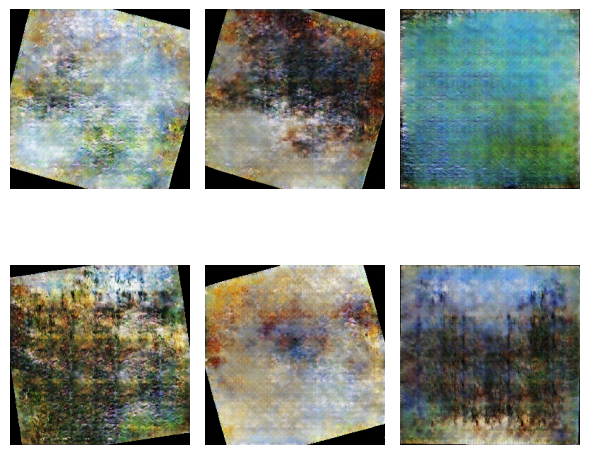

12it [00:01, 11.69it/s]

Epoch [141/200], Step [10/37], D_loss: 1.6434, G_loss: 5.3687


22it [00:01, 11.74it/s]

Epoch [141/200], Step [20/37], D_loss: 0.0447, G_loss: 2.6423


32it [00:02, 11.66it/s]

Epoch [141/200], Step [30/37], D_loss: 0.0066, G_loss: 2.5835


37it [00:03, 11.79it/s]
12it [00:01, 11.49it/s]

Epoch [142/200], Step [10/37], D_loss: 0.0325, G_loss: 3.7008


22it [00:01, 11.38it/s]

Epoch [142/200], Step [20/37], D_loss: 2.4052, G_loss: 11.5767


32it [00:02, 11.66it/s]

Epoch [142/200], Step [30/37], D_loss: 1.0535, G_loss: 0.7431


37it [00:03, 11.73it/s]
12it [00:01, 11.84it/s]

Epoch [143/200], Step [10/37], D_loss: 0.5330, G_loss: 7.5306


22it [00:01, 11.66it/s]

Epoch [143/200], Step [20/37], D_loss: 0.1174, G_loss: 4.1031


32it [00:02, 11.74it/s]

Epoch [143/200], Step [30/37], D_loss: 0.0886, G_loss: 1.8803


37it [00:03, 11.86it/s]
12it [00:01, 11.69it/s]

Epoch [144/200], Step [10/37], D_loss: 1.3696, G_loss: 3.4235


22it [00:01, 11.73it/s]

Epoch [144/200], Step [20/37], D_loss: 0.1678, G_loss: 7.3184


32it [00:02, 11.69it/s]

Epoch [144/200], Step [30/37], D_loss: 0.0713, G_loss: 1.6824


37it [00:03, 11.84it/s]
12it [00:01, 11.72it/s]

Epoch [145/200], Step [10/37], D_loss: 0.6031, G_loss: 2.6380


22it [00:01, 11.69it/s]

Epoch [145/200], Step [20/37], D_loss: 1.9119, G_loss: 7.3102


32it [00:02, 11.70it/s]

Epoch [145/200], Step [30/37], D_loss: 0.6484, G_loss: 1.7039


37it [00:03, 11.83it/s]
12it [00:01, 11.83it/s]

Epoch [146/200], Step [10/37], D_loss: 0.2490, G_loss: 3.7771


22it [00:01, 11.79it/s]

Epoch [146/200], Step [20/37], D_loss: 0.3437, G_loss: 2.0264


32it [00:02, 11.66it/s]

Epoch [146/200], Step [30/37], D_loss: 0.1757, G_loss: 1.6999


37it [00:03, 11.87it/s]
12it [00:01, 11.80it/s]

Epoch [147/200], Step [10/37], D_loss: 0.1046, G_loss: 1.7915


22it [00:01, 11.72it/s]

Epoch [147/200], Step [20/37], D_loss: 0.2708, G_loss: 4.6268


32it [00:02, 11.68it/s]

Epoch [147/200], Step [30/37], D_loss: 0.6599, G_loss: 1.2800


37it [00:03, 11.87it/s]
12it [00:01, 11.85it/s]

Epoch [148/200], Step [10/37], D_loss: 0.9086, G_loss: 1.9691


22it [00:01, 11.71it/s]

Epoch [148/200], Step [20/37], D_loss: 0.2980, G_loss: 2.3598


32it [00:02, 11.74it/s]

Epoch [148/200], Step [30/37], D_loss: 0.2747, G_loss: 7.5628


37it [00:03, 11.87it/s]
12it [00:01, 11.80it/s]

Epoch [149/200], Step [10/37], D_loss: 1.1273, G_loss: 5.2952


22it [00:01, 11.77it/s]

Epoch [149/200], Step [20/37], D_loss: 0.0803, G_loss: 6.7660


32it [00:02, 11.74it/s]

Epoch [149/200], Step [30/37], D_loss: 0.0179, G_loss: 3.4005


37it [00:03, 11.88it/s]
12it [00:01, 11.62it/s]

Epoch [150/200], Step [10/37], D_loss: 0.6708, G_loss: 9.7238


22it [00:01, 11.76it/s]

Epoch [150/200], Step [20/37], D_loss: 0.0055, G_loss: 7.6792


32it [00:02, 11.76it/s]

Epoch [150/200], Step [30/37], D_loss: 1.0060, G_loss: 6.5559


37it [00:03, 11.86it/s]


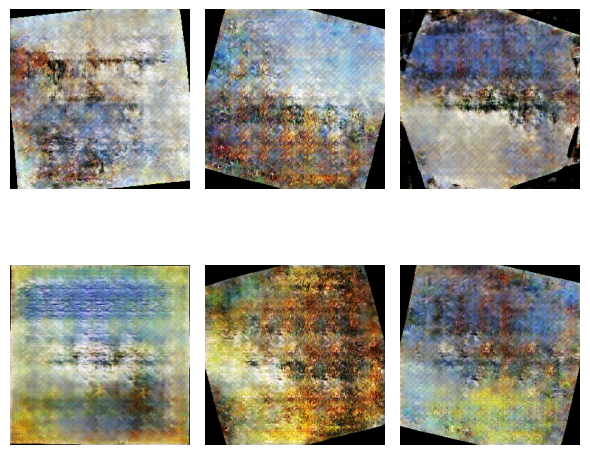

12it [00:01, 11.80it/s]

Epoch [151/200], Step [10/37], D_loss: 0.0443, G_loss: 3.7895


22it [00:01, 11.78it/s]

Epoch [151/200], Step [20/37], D_loss: 0.1516, G_loss: 0.8783


32it [00:02, 11.68it/s]

Epoch [151/200], Step [30/37], D_loss: 0.1662, G_loss: 3.9243


37it [00:03, 11.88it/s]
12it [00:01, 11.73it/s]

Epoch [152/200], Step [10/37], D_loss: 1.8887, G_loss: 2.4152


22it [00:01, 11.71it/s]

Epoch [152/200], Step [20/37], D_loss: 0.3167, G_loss: 3.7843


32it [00:02, 11.69it/s]

Epoch [152/200], Step [30/37], D_loss: 0.1847, G_loss: 2.8743


37it [00:03, 11.83it/s]
12it [00:01, 11.79it/s]

Epoch [153/200], Step [10/37], D_loss: 0.7181, G_loss: 5.1731


22it [00:01, 11.82it/s]

Epoch [153/200], Step [20/37], D_loss: 0.0731, G_loss: 5.2791


32it [00:02, 11.75it/s]

Epoch [153/200], Step [30/37], D_loss: 0.1512, G_loss: 3.4062


37it [00:03, 11.88it/s]
12it [00:01, 11.84it/s]

Epoch [154/200], Step [10/37], D_loss: 0.5036, G_loss: 3.7892


22it [00:01, 11.71it/s]

Epoch [154/200], Step [20/37], D_loss: 0.8435, G_loss: 4.7772


32it [00:02, 11.70it/s]

Epoch [154/200], Step [30/37], D_loss: 0.2582, G_loss: 4.6014


37it [00:03, 11.88it/s]
12it [00:01, 11.76it/s]

Epoch [155/200], Step [10/37], D_loss: 0.2598, G_loss: 4.7868


22it [00:01, 11.74it/s]

Epoch [155/200], Step [20/37], D_loss: 0.4876, G_loss: 4.2911


32it [00:02, 11.76it/s]

Epoch [155/200], Step [30/37], D_loss: 0.2259, G_loss: 4.9930


37it [00:03, 11.84it/s]
12it [00:01, 11.88it/s]

Epoch [156/200], Step [10/37], D_loss: 0.8029, G_loss: 3.6606


22it [00:01, 11.66it/s]

Epoch [156/200], Step [20/37], D_loss: 0.0100, G_loss: 2.0129


32it [00:02, 11.64it/s]

Epoch [156/200], Step [30/37], D_loss: 1.5609, G_loss: 5.9986


37it [00:03, 11.86it/s]
12it [00:01, 11.79it/s]

Epoch [157/200], Step [10/37], D_loss: 0.4834, G_loss: 5.9054


22it [00:01, 11.67it/s]

Epoch [157/200], Step [20/37], D_loss: 0.2693, G_loss: 2.7077


32it [00:02, 11.75it/s]

Epoch [157/200], Step [30/37], D_loss: 2.6136, G_loss: 0.9573


37it [00:03, 11.85it/s]
12it [00:01, 11.76it/s]

Epoch [158/200], Step [10/37], D_loss: 0.1043, G_loss: 2.5796


22it [00:01, 11.71it/s]

Epoch [158/200], Step [20/37], D_loss: 0.0043, G_loss: 5.1621


32it [00:02, 11.73it/s]

Epoch [158/200], Step [30/37], D_loss: 0.4912, G_loss: 3.9108


37it [00:03, 11.85it/s]
12it [00:01, 11.74it/s]

Epoch [159/200], Step [10/37], D_loss: 1.7776, G_loss: 5.9900


22it [00:01, 11.72it/s]

Epoch [159/200], Step [20/37], D_loss: 0.0672, G_loss: 2.1764


32it [00:02, 11.65it/s]

Epoch [159/200], Step [30/37], D_loss: 0.1637, G_loss: 5.0628


37it [00:03, 11.83it/s]
12it [00:01, 11.74it/s]

Epoch [160/200], Step [10/37], D_loss: 0.2479, G_loss: 2.3218


22it [00:01, 11.55it/s]

Epoch [160/200], Step [20/37], D_loss: 0.1165, G_loss: 8.8211


32it [00:02, 11.67it/s]

Epoch [160/200], Step [30/37], D_loss: 0.4108, G_loss: 3.0712


37it [00:03, 11.79it/s]


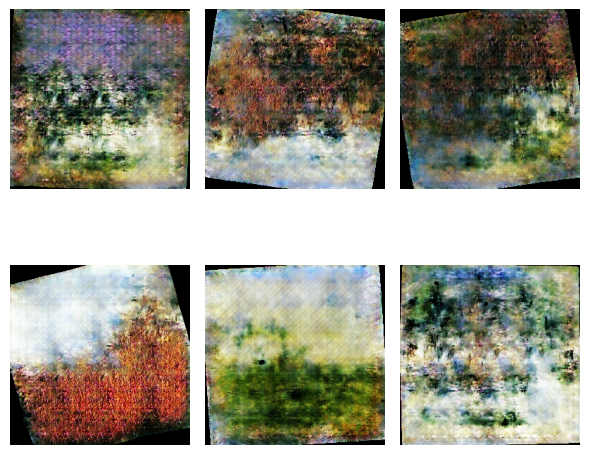

12it [00:01, 11.76it/s]

Epoch [161/200], Step [10/37], D_loss: 1.2940, G_loss: 5.9230


22it [00:01, 11.76it/s]

Epoch [161/200], Step [20/37], D_loss: 0.3248, G_loss: 5.2361


32it [00:02, 11.63it/s]

Epoch [161/200], Step [30/37], D_loss: 0.3291, G_loss: 2.5259


37it [00:03, 11.85it/s]
12it [00:01, 11.67it/s]

Epoch [162/200], Step [10/37], D_loss: 0.2035, G_loss: 8.3924


22it [00:01, 11.71it/s]

Epoch [162/200], Step [20/37], D_loss: 0.2099, G_loss: 2.0970


32it [00:02, 11.67it/s]

Epoch [162/200], Step [30/37], D_loss: 0.3381, G_loss: 3.6057


37it [00:03, 11.81it/s]
12it [00:01, 11.77it/s]

Epoch [163/200], Step [10/37], D_loss: 0.8138, G_loss: 5.4722


22it [00:01, 11.75it/s]

Epoch [163/200], Step [20/37], D_loss: 0.4507, G_loss: 4.4215


32it [00:02, 11.74it/s]

Epoch [163/200], Step [30/37], D_loss: 0.0833, G_loss: 4.2397


37it [00:03, 11.86it/s]
12it [00:01, 11.82it/s]

Epoch [164/200], Step [10/37], D_loss: 0.8584, G_loss: 3.7267


22it [00:01, 11.72it/s]

Epoch [164/200], Step [20/37], D_loss: 0.0824, G_loss: 7.8627


32it [00:02, 11.64it/s]

Epoch [164/200], Step [30/37], D_loss: 0.0485, G_loss: 2.4925


37it [00:03, 11.86it/s]
12it [00:01, 11.66it/s]

Epoch [165/200], Step [10/37], D_loss: 0.0367, G_loss: 5.2331


22it [00:01, 11.73it/s]

Epoch [165/200], Step [20/37], D_loss: 0.0956, G_loss: 4.5852


32it [00:02, 11.71it/s]

Epoch [165/200], Step [30/37], D_loss: 0.0306, G_loss: 3.4927


37it [00:03, 11.83it/s]
12it [00:01, 11.73it/s]

Epoch [166/200], Step [10/37], D_loss: 0.3762, G_loss: 4.6122


22it [00:01, 11.66it/s]

Epoch [166/200], Step [20/37], D_loss: 0.4128, G_loss: 4.3125


32it [00:02, 11.74it/s]

Epoch [166/200], Step [30/37], D_loss: 1.2096, G_loss: 5.5394


37it [00:03, 11.83it/s]
12it [00:01, 11.86it/s]

Epoch [167/200], Step [10/37], D_loss: 0.0967, G_loss: 1.1662


22it [00:01, 11.72it/s]

Epoch [167/200], Step [20/37], D_loss: 0.4112, G_loss: 1.6047


32it [00:02, 11.71it/s]

Epoch [167/200], Step [30/37], D_loss: 0.3916, G_loss: 1.6074


37it [00:03, 11.87it/s]
12it [00:01, 11.81it/s]

Epoch [168/200], Step [10/37], D_loss: 0.6480, G_loss: 4.0755


22it [00:01, 11.76it/s]

Epoch [168/200], Step [20/37], D_loss: 0.0375, G_loss: 7.6142


32it [00:02, 11.75it/s]

Epoch [168/200], Step [30/37], D_loss: 0.5124, G_loss: 4.1535


37it [00:03, 11.88it/s]
12it [00:01, 11.96it/s]

Epoch [169/200], Step [10/37], D_loss: 0.1344, G_loss: 2.6323


22it [00:01, 11.76it/s]

Epoch [169/200], Step [20/37], D_loss: 0.0430, G_loss: 6.2251


32it [00:02, 11.71it/s]

Epoch [169/200], Step [30/37], D_loss: 0.1004, G_loss: 4.9069


37it [00:03, 11.88it/s]
12it [00:01, 11.81it/s]

Epoch [170/200], Step [10/37], D_loss: 0.0637, G_loss: 4.1008


22it [00:01, 11.69it/s]

Epoch [170/200], Step [20/37], D_loss: 0.2833, G_loss: 0.5118


32it [00:02, 11.73it/s]

Epoch [170/200], Step [30/37], D_loss: 0.0507, G_loss: 4.2867


37it [00:03, 11.86it/s]


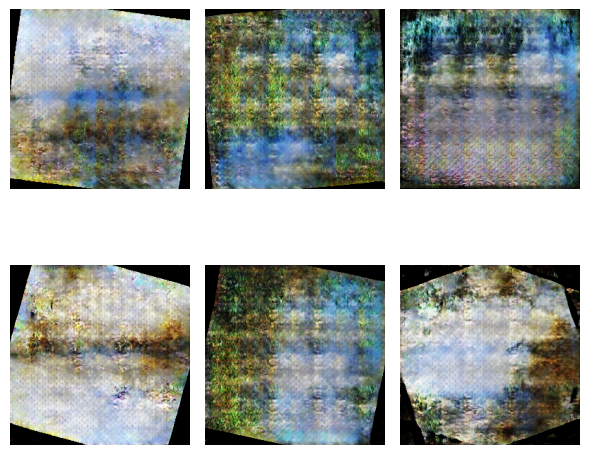

12it [00:01, 11.77it/s]

Epoch [171/200], Step [10/37], D_loss: 0.0394, G_loss: 3.1339


22it [00:01, 11.79it/s]

Epoch [171/200], Step [20/37], D_loss: 0.2488, G_loss: 5.9986


32it [00:02, 11.81it/s]

Epoch [171/200], Step [30/37], D_loss: 0.0282, G_loss: 0.4198


37it [00:03, 11.89it/s]
12it [00:01, 11.80it/s]

Epoch [172/200], Step [10/37], D_loss: 0.1412, G_loss: 8.3286


22it [00:01, 11.77it/s]

Epoch [172/200], Step [20/37], D_loss: 0.0531, G_loss: 1.7844


32it [00:02, 11.76it/s]

Epoch [172/200], Step [30/37], D_loss: 0.1169, G_loss: 0.5919


37it [00:03, 11.87it/s]
12it [00:01, 11.81it/s]

Epoch [173/200], Step [10/37], D_loss: 0.0349, G_loss: 3.5143


22it [00:01, 11.77it/s]

Epoch [173/200], Step [20/37], D_loss: 0.0821, G_loss: 4.8912


32it [00:02, 11.74it/s]

Epoch [173/200], Step [30/37], D_loss: 0.0672, G_loss: 0.1057


37it [00:03, 11.89it/s]
12it [00:01, 11.76it/s]

Epoch [174/200], Step [10/37], D_loss: 0.0485, G_loss: 4.4660


22it [00:01, 11.74it/s]

Epoch [174/200], Step [20/37], D_loss: 0.3570, G_loss: 2.9187


32it [00:02, 11.66it/s]

Epoch [174/200], Step [30/37], D_loss: 0.1878, G_loss: 5.1033


37it [00:03, 11.88it/s]
12it [00:01, 11.79it/s]

Epoch [175/200], Step [10/37], D_loss: 0.2426, G_loss: 1.2234


22it [00:01, 11.81it/s]

Epoch [175/200], Step [20/37], D_loss: 0.6622, G_loss: 4.7381


32it [00:02, 11.65it/s]

Epoch [175/200], Step [30/37], D_loss: 0.6551, G_loss: 6.5154


37it [00:03, 11.86it/s]
12it [00:01, 11.85it/s]

Epoch [176/200], Step [10/37], D_loss: 1.4749, G_loss: 7.2665


22it [00:01, 11.74it/s]

Epoch [176/200], Step [20/37], D_loss: 0.0179, G_loss: 4.3349


32it [00:02, 11.73it/s]

Epoch [176/200], Step [30/37], D_loss: 0.2432, G_loss: 3.4380


37it [00:03, 11.89it/s]
12it [00:01, 11.83it/s]

Epoch [177/200], Step [10/37], D_loss: 0.4493, G_loss: 2.6794


22it [00:01, 11.75it/s]

Epoch [177/200], Step [20/37], D_loss: 0.2655, G_loss: 5.4615


32it [00:02, 11.72it/s]

Epoch [177/200], Step [30/37], D_loss: 0.1158, G_loss: 2.2403


37it [00:03, 11.87it/s]
12it [00:01, 11.86it/s]

Epoch [178/200], Step [10/37], D_loss: 0.0264, G_loss: 5.9415


22it [00:01, 11.67it/s]

Epoch [178/200], Step [20/37], D_loss: 0.0276, G_loss: 2.1323


32it [00:02, 11.76it/s]

Epoch [178/200], Step [30/37], D_loss: 0.0487, G_loss: 6.9035


37it [00:03, 11.86it/s]
12it [00:01, 11.87it/s]

Epoch [179/200], Step [10/37], D_loss: 0.8877, G_loss: 4.3388


22it [00:01, 11.73it/s]

Epoch [179/200], Step [20/37], D_loss: 1.3234, G_loss: 0.6437


32it [00:02, 11.72it/s]

Epoch [179/200], Step [30/37], D_loss: 0.4405, G_loss: 8.3086


37it [00:03, 11.89it/s]
12it [00:01, 11.84it/s]

Epoch [180/200], Step [10/37], D_loss: 0.1378, G_loss: 3.7033


22it [00:01, 11.71it/s]

Epoch [180/200], Step [20/37], D_loss: 0.1813, G_loss: 5.1483


32it [00:02, 11.75it/s]

Epoch [180/200], Step [30/37], D_loss: 0.0530, G_loss: 3.4382


37it [00:03, 11.87it/s]


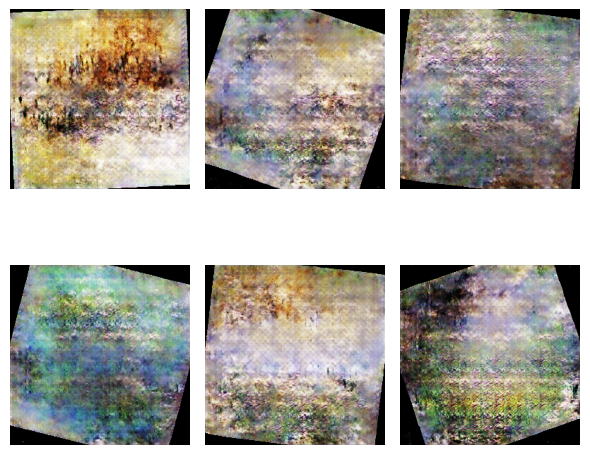

12it [00:01, 11.80it/s]

Epoch [181/200], Step [10/37], D_loss: 0.1232, G_loss: 5.1135


22it [00:01, 11.76it/s]

Epoch [181/200], Step [20/37], D_loss: 0.0680, G_loss: 7.0930


32it [00:02, 11.69it/s]

Epoch [181/200], Step [30/37], D_loss: 0.1471, G_loss: 2.6383


37it [00:03, 11.89it/s]
12it [00:01, 11.77it/s]

Epoch [182/200], Step [10/37], D_loss: 1.3417, G_loss: 1.7988


22it [00:01, 11.81it/s]

Epoch [182/200], Step [20/37], D_loss: 0.3194, G_loss: 3.8406


32it [00:02, 11.71it/s]

Epoch [182/200], Step [30/37], D_loss: 0.1034, G_loss: 4.8386


37it [00:03, 11.87it/s]
12it [00:01, 11.77it/s]

Epoch [183/200], Step [10/37], D_loss: 0.4911, G_loss: 7.2208


22it [00:01, 11.72it/s]

Epoch [183/200], Step [20/37], D_loss: 0.3930, G_loss: 3.9301


32it [00:02, 11.68it/s]

Epoch [183/200], Step [30/37], D_loss: 0.3393, G_loss: 5.7455


37it [00:03, 11.84it/s]
12it [00:01, 11.74it/s]

Epoch [184/200], Step [10/37], D_loss: 0.0975, G_loss: 2.1628


22it [00:01, 11.67it/s]

Epoch [184/200], Step [20/37], D_loss: 0.1503, G_loss: 0.8692


32it [00:02, 11.73it/s]

Epoch [184/200], Step [30/37], D_loss: 0.2684, G_loss: 2.3198


37it [00:03, 11.86it/s]
12it [00:01, 11.82it/s]

Epoch [185/200], Step [10/37], D_loss: 1.1848, G_loss: 4.3808


22it [00:01, 11.72it/s]

Epoch [185/200], Step [20/37], D_loss: 0.1210, G_loss: 0.6939


32it [00:02, 11.77it/s]

Epoch [185/200], Step [30/37], D_loss: 0.2219, G_loss: 3.4931


37it [00:03, 11.88it/s]
12it [00:01, 11.91it/s]

Epoch [186/200], Step [10/37], D_loss: 0.0354, G_loss: 3.0951


22it [00:01, 11.75it/s]

Epoch [186/200], Step [20/37], D_loss: 0.1833, G_loss: 4.8947


32it [00:02, 11.72it/s]

Epoch [186/200], Step [30/37], D_loss: 0.1739, G_loss: 6.8863


37it [00:03, 11.88it/s]
12it [00:01, 11.79it/s]

Epoch [187/200], Step [10/37], D_loss: 0.0795, G_loss: 1.2910


22it [00:01, 11.72it/s]

Epoch [187/200], Step [20/37], D_loss: 0.2381, G_loss: 3.8651


32it [00:02, 11.68it/s]

Epoch [187/200], Step [30/37], D_loss: 0.1856, G_loss: 3.5394


37it [00:03, 11.85it/s]
12it [00:01, 11.75it/s]

Epoch [188/200], Step [10/37], D_loss: 0.2546, G_loss: 7.0689


22it [00:01, 11.70it/s]

Epoch [188/200], Step [20/37], D_loss: 0.1046, G_loss: 2.1979


32it [00:02, 11.63it/s]

Epoch [188/200], Step [30/37], D_loss: 0.4451, G_loss: 1.1880


37it [00:03, 11.85it/s]
12it [00:01, 11.82it/s]

Epoch [189/200], Step [10/37], D_loss: 0.1556, G_loss: 8.9901


22it [00:01, 11.74it/s]

Epoch [189/200], Step [20/37], D_loss: 0.8257, G_loss: 5.4843


32it [00:02, 11.75it/s]

Epoch [189/200], Step [30/37], D_loss: 0.0564, G_loss: 4.9902


37it [00:03, 11.88it/s]
12it [00:01, 11.82it/s]

Epoch [190/200], Step [10/37], D_loss: 0.7833, G_loss: 3.3104


22it [00:01, 11.77it/s]

Epoch [190/200], Step [20/37], D_loss: 0.1774, G_loss: 2.8892


32it [00:02, 11.77it/s]

Epoch [190/200], Step [30/37], D_loss: 0.4420, G_loss: 3.9484


37it [00:03, 11.89it/s]


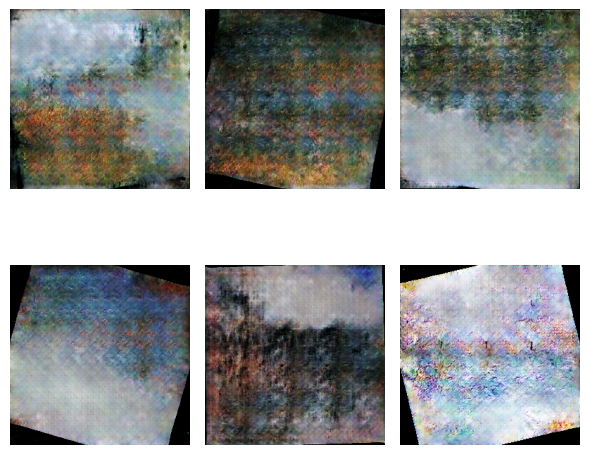

12it [00:01, 11.85it/s]

Epoch [191/200], Step [10/37], D_loss: 0.3022, G_loss: 4.0958


22it [00:01, 11.76it/s]

Epoch [191/200], Step [20/37], D_loss: 0.4530, G_loss: 2.2461


32it [00:02, 11.68it/s]

Epoch [191/200], Step [30/37], D_loss: 0.2852, G_loss: 7.3493


37it [00:03, 11.88it/s]
12it [00:01, 11.76it/s]

Epoch [192/200], Step [10/37], D_loss: 0.8274, G_loss: 5.4328


22it [00:01, 11.72it/s]

Epoch [192/200], Step [20/37], D_loss: 0.6326, G_loss: 3.0785


32it [00:02, 11.70it/s]

Epoch [192/200], Step [30/37], D_loss: 0.0814, G_loss: 7.4453


37it [00:03, 11.86it/s]
12it [00:01, 11.80it/s]

Epoch [193/200], Step [10/37], D_loss: 1.6819, G_loss: 4.1128


22it [00:01, 11.73it/s]

Epoch [193/200], Step [20/37], D_loss: 0.1291, G_loss: 4.7825


32it [00:02, 11.70it/s]

Epoch [193/200], Step [30/37], D_loss: 0.1657, G_loss: 5.9891


37it [00:03, 11.86it/s]
12it [00:01, 11.85it/s]

Epoch [194/200], Step [10/37], D_loss: 0.7524, G_loss: 6.1286


22it [00:01, 11.76it/s]

Epoch [194/200], Step [20/37], D_loss: 0.1171, G_loss: 4.3449


32it [00:02, 11.73it/s]

Epoch [194/200], Step [30/37], D_loss: 0.2083, G_loss: 0.6105


37it [00:03, 11.88it/s]
12it [00:01, 11.82it/s]

Epoch [195/200], Step [10/37], D_loss: 0.8111, G_loss: 5.8988


22it [00:01, 11.74it/s]

Epoch [195/200], Step [20/37], D_loss: 0.1473, G_loss: 1.9787


32it [00:02, 11.72it/s]

Epoch [195/200], Step [30/37], D_loss: 0.1381, G_loss: 3.6995


37it [00:03, 11.86it/s]
12it [00:01, 11.89it/s]

Epoch [196/200], Step [10/37], D_loss: 3.6621, G_loss: 3.0675


22it [00:01, 11.78it/s]

Epoch [196/200], Step [20/37], D_loss: 0.1912, G_loss: 5.6239


32it [00:02, 11.72it/s]

Epoch [196/200], Step [30/37], D_loss: 0.1796, G_loss: 1.8029


37it [00:03, 11.88it/s]
12it [00:01, 11.91it/s]

Epoch [197/200], Step [10/37], D_loss: 0.9827, G_loss: 1.8181


22it [00:01, 11.74it/s]

Epoch [197/200], Step [20/37], D_loss: 0.2916, G_loss: 6.4386


32it [00:02, 11.68it/s]

Epoch [197/200], Step [30/37], D_loss: 0.2577, G_loss: 1.5555


37it [00:03, 11.89it/s]
12it [00:01, 11.91it/s]

Epoch [198/200], Step [10/37], D_loss: 0.2758, G_loss: 5.4043


22it [00:01, 11.71it/s]

Epoch [198/200], Step [20/37], D_loss: 0.1087, G_loss: 3.1892


32it [00:02, 11.73it/s]

Epoch [198/200], Step [30/37], D_loss: 0.0476, G_loss: 4.7254


37it [00:03, 11.89it/s]
12it [00:01, 11.81it/s]

Epoch [199/200], Step [10/37], D_loss: 0.0334, G_loss: 8.2098


22it [00:01, 11.76it/s]

Epoch [199/200], Step [20/37], D_loss: 0.5988, G_loss: 2.0080


32it [00:02, 11.70it/s]

Epoch [199/200], Step [30/37], D_loss: 0.1032, G_loss: 7.5517


37it [00:03, 11.86it/s]
12it [00:01, 11.67it/s]

Epoch [200/200], Step [10/37], D_loss: 0.8120, G_loss: 3.0692


22it [00:01, 11.70it/s]

Epoch [200/200], Step [20/37], D_loss: 0.6804, G_loss: 1.9547


32it [00:02, 11.80it/s]

Epoch [200/200], Step [30/37], D_loss: 0.1096, G_loss: 4.1831


37it [00:03, 11.87it/s]


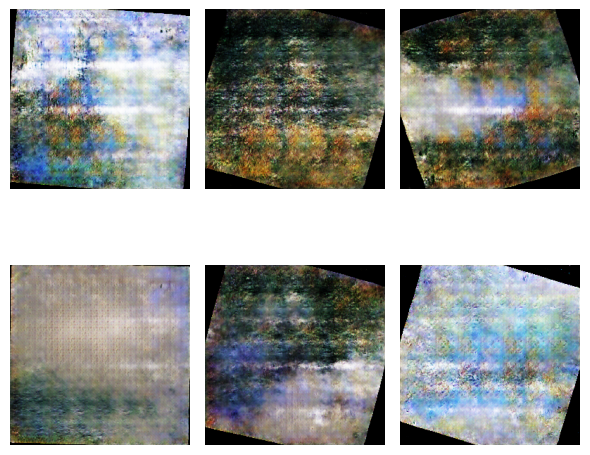

In [37]:
from tqdm import tqdm
lr = 4e-4
num_epochs = 200
optimizer_G = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.99))
optimizer_D = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.99))
# Training loop
print(len(dataloader))
for epoch in range(num_epochs):
    for i, real_images in tqdm(enumerate(dataloader)):
        batch_size = real_images.size(0)
        real_labels = torch.ones(batch_size, 1).to(device)
        fake_labels = torch.zeros(batch_size, 1).to(device)
        real_images = real_images.to(device)

        # Train Discriminator
        optimizer_D.zero_grad()
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        
        z = torch.randn(batch_size, latent_dim).to(device)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optimizer_D.step()

        # Train Generator
        optimizer_G.zero_grad()
        z = torch.randn(batch_size, latent_dim).to(device)
        fake_images = generator(z)
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        optimizer_G.step()

        if (i + 1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(dataloader)}], "
                  f"D_loss: {d_loss.item():.4f}, G_loss: {g_loss.item():.4f}")

    # Save generated images
    if (epoch + 1) % 10 == 0:
        z = torch.randn(6, latent_dim).to(device)
        fake_images = generator(z)
        plot_gen_images(fake_images.detach())


Outputs are starting to look like  paintings, maybe not Monet, but could be paintings 

In [38]:
# # Save final model
# final_model_path = 'with_residuals_v3.pth'
# torch.save({
#     'generator': generator.state_dict(),
#     'discriminator': discriminator.state_dict(),
# }, final_model_path)


In [32]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model_path = '/kaggle/input/residuals/pytorch/default/1/with_residuals_v3.pth'
checkpoint = torch.load(model_path, map_location=torch.device('cpu'))


generator.load_state_dict(checkpoint['generator'])
generator.eval()


Generator(
  (net): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(128, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inpla

In [35]:
os.makedirs('../tmp/images', exist_ok=True)
import shutil
from zipfile import ZipFile
from tqdm import tqdm
# Generate Monet-style images and save them
with torch.no_grad():
    for i in tqdm(range(7500)):
        z = torch.randn(1, latent_dim).to(device)
        fake_images = generator(z)[0].detach().cpu().permute(1, 2, 0).numpy() * 0.5 + 0.5
        im = Image.fromarray((fake_images * 255).astype(np.uint8))
        im.save(f"../tmp/images/{i}.jpg")

# Zip the generated images
output_zip_path = "/kaggle/working/images.zip"
with ZipFile(output_zip_path, 'w') as zipf:
    for root, _, files in os.walk('../tmp/images'):
        for file in files:
            zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), '../tmp/images'))

print(f"Submission file created at {output_zip_path}")

100%|██████████| 7500/7500 [05:36<00:00, 22.29it/s]


Submission file created at /kaggle/working/images.zip


# Conclusion 

The image generation still has a long way to go to replicate the talented brush strokes of Monet. There are a number of ways in which this could be improved, but were not implemented due to time constraints: 

1. Different neural net sizes for generator and discriminator 
2. Compare different activation functions 
3. Different loss functions 
4. Improve augmentation of image data 
5. Different GAN architectures